In [ ]:
!pip install pandas

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
pd.set_option('display.max_rows', None)
#pd.reset_option('display.max_rows')

*note: pd.set_option and pd.reset_option allow us to display whole df (if it is not bigger than 5000 rows).

# I. Extract data - read csv

In [ ]:
df = pd.read_csv("data_BESSS.csv")
df = df.drop('Unnamed: 0', axis=1)
df.head(100)

,time,Active Power Setpoint,SOC,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,Battery part Fan Vb1 Feedback,Avg. Cell Temperature,Max. Cell Temperatue,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature
0,2022-02-21 00:01:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.267385,0.638462
1,2022-02-21 00:02:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.278923,0.638462
2,2022-02-21 00:03:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.632212,0.595433,0.0,0.282769,0.637019
3,2022-02-21 00:04:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.595433,0.0,0.294308,0.635337
4,2022-02-21 00:05:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.304769,0.635337
5,2022-02-21 00:06:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.302923,0.632212
6,2022-02-21 00:07:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.633894,0.596875,0.0,0.307692,0.632212
7,2022-02-21 00:08:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.317385,0.630769
8,2022-02-21 00:09:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.318308,0.630769
9,2022-02-21 00:10:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.598558,0.0,0.307692,0.629327


Finding of a sampling period

In [ ]:
df['time'] = pd.to_datetime(df['time'])
time_diff = df['time'].diff()

# mean
time_diff.mean()

Timedelta('0 days 00:01:19.230093535')

Based on the output we can see that data are not sampled uniformly. For our sampling period we take 1 minute (because it is most represented and the mean is closest to it...). At the same time we need to pick smaller period as we do not want to downsample the data. So the 1M fits best.

# II. and III. Retrieve and convert the timestamp and Resample to uniform sampling and find a reasonable approach to aggregate/interpolate data

Firstly, we set the time column as the index of our data frame

In [ ]:
# setting time column as index
df = df.set_index("time")
df.head(100)

,Active Power Setpoint,SOC,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,Battery part Fan Vb1 Feedback,Avg. Cell Temperature,Max. Cell Temperatue,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature
time,,,,,,,,,,,,
2022-02-21 00:01:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.267385,0.638462
2022-02-21 00:02:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.278923,0.638462
2022-02-21 00:03:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.632212,0.595433,0.0,0.282769,0.637019
2022-02-21 00:04:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.595433,0.0,0.294308,0.635337
2022-02-21 00:05:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.304769,0.635337
2022-02-21 00:06:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.302923,0.632212
2022-02-21 00:07:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.633894,0.596875,0.0,0.307692,0.632212
2022-02-21 00:08:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.317385,0.630769
2022-02-21 00:09:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.318308,0.630769


Searching for missing outside temperature values which will be replaced using API

In [ ]:
vector = np.array(df['Outside Temperature'])
nan_indices = np.isnan(vector)
nan_indices = np.where(nan_indices)[0]

In [ ]:
#print(nan_indices)

If given missing data are not discrete (all of them are in one sequence one after another and no other recorded value is following them) it means that after resampling and linear interpolation all of them will have the same exact value (same as the one out of which they were interpolated - because on the opposite end there is no other value between which would be these values lineary distributed. In the following code we will test it.

In [ ]:
for i in range(1,len(nan_indices)):
  if nan_indices[i]-nan_indices[i-1] != 1:
    print('There are some discrete measured outside temperature values')
    break
  if i == len(nan_indices)-1:
    print('All of mising outside temperature values are one after another')


All of mising outside temperature values are one after another


We have proven that the missing data's indices are elements of a vector containing elements increasing one by one... To substitute all of these missing data we therefore need only the first indice which we will use to find the index of the first missing outside temperature value. We can not use this indice directly because due to resampling it might change (data was added to our data frame).

Resampling to 1 minute.
We create new data frame with smaller sampling period. Inferred data are lineary interpolated...

In [ ]:
#pd.set_option('display.max_columns', None)

In [ ]:
df_resampled = df.resample('1T').interpolate(method='linear')

# ffill for fan speed
for index in df_resampled.index:
  if df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] > 0.5:
    df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] = 1
  elif df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] < 0.5:
    df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] = 0
  else:
    df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] = np.NaN
    df_resampled['HVAC Battery part Circulation Fan V1'] = df['HVAC Battery part Circulation Fan V1'].ffill()
df_resampled['HVAC Battery part Circulation Fan V1'] = df_resampled['HVAC Battery part Circulation Fan V1'].fillna(method='ffill')
#print(df_resampled['HVAC Battery part Circulation Fan V1'])

In [ ]:
# heating
for index in df_resampled.index:
  if df_resampled.at[index, 'HVAC Battery part heating'] > 0.5:
    df_resampled.at[index, 'HVAC Battery part heating'] = 1
  elif df_resampled.at[index, 'HVAC Battery part heating'] < 0.5:
    df_resampled.at[index, 'HVAC Battery part heating'] = 0
  else:
    df_resampled.at[index, 'HVAC Battery part heating'] = np.NaN
    df_resampled['HVAC Battery part heating'] = df['HVAC Battery part heating'].ffill()
df_resampled['HVAC Battery part heating'] = df_resampled['HVAC Battery part heating'].fillna(method='ffill')

In [ ]:
# for cooling
for index in df_resampled.index:
  if df_resampled.at[index, 'HVAC Battery part cooling'] > 0.5:
    df_resampled.at[index, 'HVAC Battery part cooling'] = 1
  elif df_resampled.at[index, 'HVAC Battery part cooling'] < 0.5:
    df_resampled.at[index, 'HVAC Battery part cooling'] = 0
  else:
    df_resampled.at[index, 'HVAC Battery part cooling'] = np.NaN
    df_resampled['HVAC Battery part cooling'] = df['HVAC Battery part cooling'].ffill()
df_resampled['HVAC Battery part cooling'] = df_resampled['HVAC Battery part cooling'].fillna(method='ffill')

In [ ]:
print(df_resampled['HVAC Battery part Circulation Fan V1'][0:2402])

time
2022-02-21 00:01:00+00:00    0.0
2022-02-21 00:02:00+00:00    0.0
2022-02-21 00:03:00+00:00    0.0
2022-02-21 00:04:00+00:00    0.0
2022-02-21 00:05:00+00:00    0.0
2022-02-21 00:06:00+00:00    0.0
2022-02-21 00:07:00+00:00    0.0
2022-02-21 00:08:00+00:00    0.0
2022-02-21 00:09:00+00:00    0.0
2022-02-21 00:10:00+00:00    0.0
2022-02-21 00:11:00+00:00    0.0
2022-02-21 00:12:00+00:00    0.0
2022-02-21 00:13:00+00:00    0.0
2022-02-21 00:14:00+00:00    0.0
2022-02-21 00:15:00+00:00    0.0
2022-02-21 00:16:00+00:00    0.0
2022-02-21 00:17:00+00:00    0.0
2022-02-21 00:18:00+00:00    0.0
2022-02-21 00:19:00+00:00    0.0
2022-02-21 00:20:00+00:00    0.0
2022-02-21 00:21:00+00:00    0.0
2022-02-21 00:22:00+00:00    0.0
2022-02-21 00:23:00+00:00    0.0
2022-02-21 00:24:00+00:00    0.0
2022-02-21 00:25:00+00:00    0.0
2022-02-21 00:26:00+00:00    0.0
2022-02-21 00:27:00+00:00    0.0
2022-02-21 00:28:00+00:00    0.0
2022-02-21 00:29:00+00:00    0.0
2022-02-21 00:30:00+00:00    0.0
2022-

In [ ]:
for index in df_resampled.index:
  if df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] > 0.5:
    df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] = 1
  elif df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] < 0.5:
    df_resampled.at[index, 'HVAC Battery part Circulation Fan V1'] = 0
  else:
    print('predsa tam je')

In [ ]:
df_resampled.tail(5000)

,Active Power Setpoint,SOC,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,Battery part Fan Vb1 Feedback,Avg. Cell Temperature,Max. Cell Temperatue,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature
time,,,,,,,,,,,,
2022-05-23 12:42:00+00:00,0.00,0.772055,0.0,0.0,0.0,0.0,0.558182,0.592538,0.529709,0.000000,0.376923,0.502812
2022-05-23 12:43:00+00:00,0.00,0.772055,0.0,0.0,0.0,0.0,0.558156,0.592512,0.529685,0.000000,0.376923,0.502806
2022-05-23 12:44:00+00:00,0.00,0.772054,0.0,0.0,0.0,0.0,0.558129,0.592487,0.529660,0.000000,0.376923,0.502800
2022-05-23 12:45:00+00:00,0.00,0.772053,0.0,0.0,0.0,0.0,0.558103,0.592461,0.529636,0.000000,0.376923,0.502795
2022-05-23 12:46:00+00:00,0.00,0.772052,0.0,0.0,0.0,0.0,0.558076,0.592435,0.529611,0.000000,0.376923,0.502789
2022-05-23 12:47:00+00:00,0.00,0.772051,0.0,0.0,0.0,0.0,0.558049,0.592410,0.529587,0.000000,0.376923,0.502783
2022-05-23 12:48:00+00:00,0.00,0.772051,0.0,0.0,0.0,0.0,0.558023,0.592384,0.529562,0.000000,0.376923,0.502777
2022-05-23 12:49:00+00:00,0.00,0.772050,0.0,0.0,0.0,0.0,0.557996,0.592358,0.529538,0.000000,0.376923,0.502772
2022-05-23 12:50:00+00:00,0.00,0.772049,0.0,0.0,0.0,0.0,0.557969,0.592333,0.529514,0.000000,0.376923,0.502766


# IV. A - Data origin column creation (original or inferred)

At first we add new column to our resampled data frame which we named as data_source. All of the cells inside this column are filled with string 'inferred'. In for cycle we look at every single index from both data frames (original and resampled) and if they match, cell in column data_source ('inferred') is substituted with string 'original'.

In [ ]:
df_resampled['data_source'] = 'inferred'
for index in df.index:
    if index in df_resampled.index:
        df_resampled.at[index, 'data_source'] = 'original'

If we wanted to know indices of these inferred data values...

In [ ]:
#Firstly we need to find out how many of the data were inferred
number_of_inferred = 0
a = 0
for k in df_resampled['data_source']:
  if k == 'inferred':
    number_of_inferred += 1
print(number_of_inferred)

33203


In [ ]:
# In the second step we put indexes of inferred data into vector initialised above
inferred_indices = np.zeros(number_of_inferred)
a = 0
i = 0
for k in df_resampled['data_source']:
  if k == 'inferred':
    inferred_indices[i] = a
    i+=1
  a+=1

In [ ]:
print(inferred_indices)

[   190.    396.    560. ... 136373. 136603. 136652.]


We would need them in case the missing outside temperature data were not one after the other or if they were followed by measured temperature data. But as far as they are not, we don't need them

In [ ]:
df_resampled.columns

Index(['Active Power Setpoint', 'SOC', 'HVAC Battery part Circulation Fan V1',
       'HVAC Battery part heating', 'HVAC Battery part cooling',
       'Battery part Fan Vb1 Feedback', 'Avg. Cell Temperature',
       'Max. Cell Temperatue', 'Min. Cell Temperature', 'String Power',
       'Outside Temperature', 'Ambient Temperature', 'data_source'],
      dtype='object')

This command informs us about the names of the columns. It is a useful command as far as we need to know the columns' names when we want to work with them.

Result check

In [ ]:
df_resampled

# V. Use API to acquire missing outside temperature(at Liptovsky Hradok)

API provides us connection with server where we can find desired data. In our case we want to substitue inferred data for streamed data from server. We need to therefore find a given period (February - May 2022). Fortunately, also these "more historical" data are preserved. On the https://archive-api.open-meteo.com we have selected region and period... and wanted variable which was temperature recorded in frequeny of one hour. So for each day we have 24 data. As far as our data have much smaller sampling period, most of the substued data will be interpolated out of these loaded ones.

At first we need to find the index (time) from which are the temperature data (that we want to replace using API) missing.

In [ ]:
last_temperature_value = df['Outside Temperature'][nan_indices[0]-1]
searched_row = df[df['Outside Temperature'] == last_temperature_value]
# Desired index is the last one containing this exact temperature value, because that is the last recorded data of the whole column
print('Data are missing from time:', searched_row.index[-1], 'till time:', df_resampled.index[-1])

Time 2022-02-22 14:08:00+00:00 represents the last index where the data was recorde. Therefore we are filling the column from the time one minute later. Code bellow represents way of how to increase time by one minute  

In [ ]:
last_datetime = searched_row.index[-1]
timestamp = pd.Timestamp(last_datetime)
# Convert Timestamp to Python datetime object
datetime_object = timestamp.to_pydatetime()

In [ ]:
from datetime import datetime, timedelta

timestamp = pd.Timestamp(datetime_object)

# Convert Timestamp to Python datetime object
datetime_object = timestamp.to_pydatetime()
first_datetime = datetime_object + timedelta(minutes=1)

print("Original date:", last_datetime)
print("New date:", first_datetime)

Importing of streamed data

In [ ]:
from pprint import pprint
import requests

URL = 'https://archive-api.open-meteo.com/v1/archive?latitude=49.0396&longitude=19.7233&start_date=2022-02-21&end_date=2022-05-27&hourly=temperature_2m&timezone=auto'
response = requests.get(URL)
data = response.json()

We have imported time and temperature variables

In [ ]:
# Firstly, we separate loaded data into columns. We are curious about time and temperature data
time_column = data['hourly']['time']
temperature_column = data['hourly']['temperature_2m']

# Temperature data are normalised
normalised_temperature_column = (np.array(temperature_column)-(-15))/(50-(-15))

# New data frame is created in which will be these two columns: streamed weather data and corresponding time
weather_df = pd.DataFrame({'time': time_column, 'temperature_2m': normalised_temperature_column})

# Always when we want to set time column as index we need to convert it to datetime variable type
weather_df['time'] = pd.to_datetime(weather_df['time'])

# Time set as index
weather_df = weather_df.set_index('time')

# Resampling to one minute
weather_df = weather_df.resample('1T').interpolate(method='linear')


In [ ]:
# df_resampled.head(4000)

Substitution of inferred Outside wheather temperature values for streamed data from api... Both data frames have same sampling period and display same time period - equal index.

In [ ]:
for index in df_resampled.index:
  if index >= first_datetime: # or: if index > last_datetime
    df_resampled.at[index, 'Outside Temperature'] = weather_df.at[index, 'temperature_2m']

<ipython-input-119-7378d57d38fc>:3: FutureWarning: Indexing a timezone-naive DatetimeIndex with a timezone-aware datetime is deprecated and will raise KeyError in a future version.  Use a timezone-naive object instead.
  df_resampled.at[index, 'Outside Temperature'] = weather_df.at[index, 'temperature_2m']


Result check:

In [ ]:
df_resampled.head(40)

,Active Power Setpoint,SOC,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,Battery part Fan Vb1 Feedback,Avg. Cell Temperature,Max. Cell Temperatue,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature,data_source,Desired discharging,Desired charging,Real discharging,Real charging
time,,,,,,,,,,,,,,,,,
2022-02-21 00:01:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.267385,0.638462,original,0,0,0,0
2022-02-21 00:02:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.613942,0.632212,0.595433,0.0,0.278923,0.638462,original,0,0,0,0
2022-02-21 00:03:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.632212,0.595433,0.0,0.282769,0.637019,original,0,0,0,0
2022-02-21 00:04:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.595433,0.0,0.294308,0.635337,original,0,0,0,0
2022-02-21 00:05:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.304769,0.635337,original,0,0,0,0
2022-02-21 00:06:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.615385,0.633894,0.596875,0.0,0.302923,0.632212,original,0,0,0,0
2022-02-21 00:07:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.633894,0.596875,0.0,0.307692,0.632212,original,0,0,0,0
2022-02-21 00:08:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.317385,0.630769,original,0,0,0,0
2022-02-21 00:09:00+00:00,0.0,0.935,0.0,0.0,0.0,0.0,0.616827,0.635337,0.596875,0.0,0.318308,0.630769,original,0,0,0,0


# VI. Spit charging and discharging to separate columns (both real and desired)

In these four columns (which represent state of battery cell - whether it is being charged, discharged or if it remains unchanged) we can find values ranging from -1 to 1 (closed interval). If the value is negative, it means that battery is discharging, if it is positive, it is charging and if it is 0 it remains unchanged.
We have to types of columns: desired (set point) values and the real values. Out of these two columns we will therefore create four.

In [ ]:
# Initialisation - preparing vectors with the length equal to number of rows in data frame
discharging_desired = np.ones(len(np.array(df_resampled['Active Power Setpoint'])), list)
charging_desired = np.ones(len(np.array(df_resampled['Active Power Setpoint'])),list)
discharging_real = np.ones(len(np.array(df_resampled['String Power'])), list)
charging_real = np.ones(len(np.array(df_resampled['String Power'])),list)

In [ ]:
print(discharging_real)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

Filling of the vectors

In [ ]:
i = 0
for index in df_resampled.index:
  if df_resampled.at[index, 'Active Power Setpoint'] > 0:
    discharging_desired[i] = df_resampled.at[index, 'Active Power Setpoint']
    charging_desired[i] = np.nan
  elif df_resampled.at[index, 'Active Power Setpoint'] < 0:
    discharging_desired[i] = np.nan
    charging_desired[i] = df_resampled.at[index, 'Active Power Setpoint']
  else:
    discharging_desired[i] = 0
    charging_desired[i] = 0
  i+=1

# Addition of newly created columns into our data frame
df_resampled['Desired discharging'] = discharging_desired
df_resampled['Desired charging'] = charging_desired

# Same we do for the real values - second column
i = 0
for index in df_resampled.index:
  if df_resampled.at[index, 'String Power'] > 0:
    discharging_real[i] = df_resampled.at[index, 'String Power']
    # print(df_resampled.at[index, 'String Power'])
    charging_real[i] = np.nan
  elif df_resampled.at[index, 'String Power'] < 0:
    discharging_real[i] = np.nan
    charging_real[i] = df_resampled.at[index, 'String Power']
  else:
    discharging_real[i] = 0
    charging_real[i] = 0
  i+=1
print(discharging_real)
df_resampled['Real discharging'] = discharging_real
df_resampled['Real charging'] = charging_real

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

In [ ]:
#df_resampled['String Power']
print(charging_desired)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

# VII. Data aggregation to get daily information

Our task is to aggregate data for each day (ideally in the form of a new data frame where the sampling period is 1 day)

In [ ]:
# For each column we initialise a corresponding vector number of elements of which is the number of days between 21.2 and 26.5. (and that is 95).
fan_daily_sum = np.zeros(95)
heating_daily_sum = np.zeros(95)
cooling_daily_sum = np.zeros(95)
fan_b_daily_mean = np.zeros(95)
power_setpoint_daily_mean = np.zeros(95)
SOC_daily_mean = np.zeros(95)
avg_temperature_daily_mean = np.zeros(95)
max_temperature_daily_mean = np.zeros(95)
min_temperature_daily_mean = np.zeros(95)
string_power_daily_mean = np.zeros(95)
outside_temperature_daily_mean = np.zeros(95)
ambient_temperature_daily_mean = np.zeros(95)
desired_discharging_daily_mean = np.zeros(95)
desired_charging_daily_mean = np.zeros(95)
real_discharging_daily_mean = np.zeros(95)
real_charging_daily_mean = np.zeros(95)


# After every 1440 data we do given aggregating operation (sum or mean, depends on whether we are transforming binary or numeric data). This sum or mean value is then written into above initialised vector.
a = 0
b = 0
i = 0
for index in df_resampled.index:
  i+=1
  if i % 1440 == 0:
    fan_daily_sum[b] = df_resampled['HVAC Battery part Circulation Fan V1'][a:a+1440].aggregate(sum)
    heating_daily_sum[b] = df_resampled['HVAC Battery part heating'][a:a+1440].aggregate(sum)
    cooling_daily_sum[b] = df_resampled['HVAC Battery part cooling'][a:a+1440].aggregate(sum)
    fan_b_daily_mean[b] = df_resampled['Battery part Fan Vb1 Feedback'][a:a+1440].aggregate('mean')
    power_setpoint_daily_mean[b] = df_resampled['Active Power Setpoint'][a:a+1440].aggregate('mean')
    SOC_daily_mean[b] = df_resampled['SOC'][a:a+1440].aggregate('mean')
    avg_temperature_daily_mean[b] = df_resampled['Avg. Cell Temperature'][a:a+1440].aggregate('mean')
    max_temperature_daily_mean[b] = df_resampled['Max. Cell Temperatue'][a:a+1440].aggregate('mean')
    min_temperature_daily_mean[b] = df_resampled['Min. Cell Temperature'][a:a+1440].aggregate('mean')
    string_power_daily_mean[b] = df_resampled['String Power'][a:a+1440].aggregate('mean')
    outside_temperature_daily_mean[b] = df_resampled['Outside Temperature'][a:a+1440].aggregate('mean')
    ambient_temperature_daily_mean[b] = df_resampled['Ambient Temperature'][a:a+1440].aggregate('mean')
    desired_discharging_daily_mean[b] = df_resampled['Desired discharging'][a:a+1440].aggregate('mean')
    real_discharging_daily_mean[b] = df_resampled['Real discharging'][a:a+1440].aggregate('mean')
    real_charging_daily_mean[b] = df_resampled['Real charging'][a:a+1440].aggregate('mean')
    desired_charging_daily_mean[b] = df_resampled['Desired charging'][a:a+1440].aggregate('mean')

    a += 1440
    b += 1


Results check

In [ ]:
# print(power_setpoint_daily_mean)
# print(SOC_daily_mean)
# print(fan_daily_sum)
# print(heating_daily_sum)
# print(cooling_daily_sum)
# print(fan_b_daily_sum)
# print(avg_temperature_daily_mean)
# print(max_temperature_daily_mean)
# print(min_temperature_daily_mean)
# print(string_power_daily_mean)
# print(outside_temperature_daily_mean)
# print(ambient_temperature_daily_mean)
# print(desired_discharging_daily_mean)
# print(desired_charging_daily_mean)
print(real_discharging_daily_mean)
# print(real_charging_daily_mean)

[0.04070316 0.         0.00208575 0.00735808 0.03321559 0.
 0.00408436 0.         0.00091294 0.         0.         0.05084194
 0.         0.         0.01978548 0.04285193 0.03676833 0.05559023
 0.         0.         0.         0.10184613 0.13961389 0.
 0.         0.         0.         0.         0.009354   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.08382327 0.
 0.         0.01555119 0.05293182 0.09886395 0.         0.
 0.         0.         0.         0.         0.04450361 0.
 0.         0.00122214 0.001188   0.04929498 0.00679798 0.
 0.01868141 0.         0.11058041 0.         0.         0.05325976
 0.08659763 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.04420679 0.00032172 0.
 0.         0.         0.11203998 0.17750689 0.11947824]


Check

In [ ]:
pd.set_option('display.max_columns', None)
#no = df_resampled['HVAC Battery part Circulation Fan V1'][0:1440].values#.aggregate(sum)
np.set_printoptions(threshold=np.inf)
#print(no)

Result

In [ ]:
#df_resampled.head(5000)

Finally we create new data frame for all of these aggregated daily values

In [ ]:
# Setting the start and end times
start_time = '2022-02-21 00:00:00'
end_time = '2022-05-26 00:00:00'

# Setting the interval period
time_interval = '1D'

# Generation of a range of timestamps with the specified interval (later used as the index)
time_range = pd.date_range(start=start_time, end=end_time, freq=time_interval)

# New data frame with its first column
fan_v1_sum_1 = {'Daily sum of HVAC Battery part Circulation Fan V1': fan_daily_sum}

# Addition of the rest columns
df_daily = pd.DataFrame(fan_v1_sum_1, index=time_range)
df_daily['Daily sum of HVAC Battery part heating'] = heating_daily_sum
df_daily['Daily sum of HVAC Battery part cooling'] = cooling_daily_sum
df_daily['Daily mean of HVAC Battery part Circulation Fan V1b Feedback'] = fan_b_daily_mean
df_daily['Daily mean of Active Power Setpoint'] = cooling_daily_sum
df_daily['Daily mean of SOC'] = SOC_daily_mean
df_daily['Daily mean of Avg. Cell Temperature'] = avg_temperature_daily_mean
df_daily['Daily mean of Max. Cell Temperature'] = max_temperature_daily_mean
df_daily['Daily mean of Min. Cell Temperature'] = min_temperature_daily_mean
df_daily['Daily mean of String Power'] = string_power_daily_mean
df_daily['Daily mean of Outside Temperature'] = outside_temperature_daily_mean
df_daily['Daily mean of Ambient Temperature'] = ambient_temperature_daily_mean
df_daily['Daily mean of Desired dicharging'] = desired_discharging_daily_mean
df_daily['Daily mean of Desired charging'] = desired_charging_daily_mean
df_daily['Daily mean of Real discharging'] = real_discharging_daily_mean
df_daily['Daily mean of Real charging'] = real_charging_daily_mean

# Result
df_daily

rmse = np.sqrt(np.mean((desired_charging_daily_mean - real_charging_daily_mean)**2))
print("RMSE:", rmse)

RMSE: 0.06789534869643661


# LOAD

VIII A

In [ ]:
# removing year part
month_time = pd.to_datetime(df_daily.index)  # Convert index to datetime object
month_time = df_daily.index.strftime('%m-%d')
month_time

Index(['02-21', '02-22', '02-23', '02-24', '02-25', '02-26', '02-27', '02-28',
       '03-01', '03-02', '03-03', '03-04', '03-05', '03-06', '03-07', '03-08',
       '03-09', '03-10', '03-11', '03-12', '03-13', '03-14', '03-15', '03-16',
       '03-17', '03-18', '03-19', '03-20', '03-21', '03-22', '03-23', '03-24',
       '03-25', '03-26', '03-27', '03-28', '03-29', '03-30', '03-31', '04-01',
       '04-02', '04-03', '04-04', '04-05', '04-06', '04-07', '04-08', '04-09',
       '04-10', '04-11', '04-12', '04-13', '04-14', '04-15', '04-16', '04-17',
       '04-18', '04-19', '04-20', '04-21', '04-22', '04-23', '04-24', '04-25',
       '04-26', '04-27', '04-28', '04-29', '04-30', '05-01', '05-02', '05-03',
       '05-04', '05-05', '05-06', '05-07', '05-08', '05-09', '05-10', '05-11',
       '05-12', '05-13', '05-14', '05-15', '05-16', '05-17', '05-18', '05-19',
       '05-20', '05-21', '05-22', '05-23', '05-24', '05-25', '05-26'],
      dtype='object')

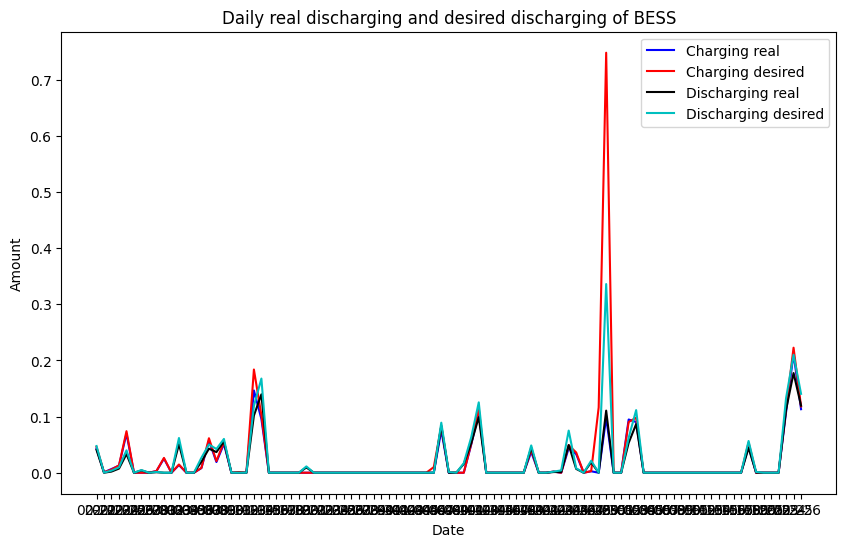

In [ ]:
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with aggregated daily data
plt.figure(figsize=(10, 6))

# Plotting daily charging and discharging
plt.plot(month_time, real_charging_daily_mean*-1, 'b', label='Charging real')
plt.plot(month_time, desired_charging_daily_mean*-1, 'r', label='Charging desired')

plt.xlabel('Date')
plt.ylabel('Amount')
plt.title('Daily real charging and desired charging of BESS')
plt.legend()

#plt.figure(figsize=(10, 6))

# Plotting daily desired discharging and real discharging
plt.plot(month_time, real_discharging_daily_mean, 'k', label='Discharging real')
plt.plot(month_time, desired_discharging_daily_mean, 'c', label='Discharging desired')
#plt.plot(month_time, real_discharging_daily_mean*-1, 'r', label='Discharging')

# Adding labels and legend
plt.xlabel('Date')
plt.ylabel('Amount')
plt.title('Daily real discharging and desired discharging of BESS')
plt.legend()

# Show the plot
plt.show()

# conclusion about multiple vs single BESS (word)

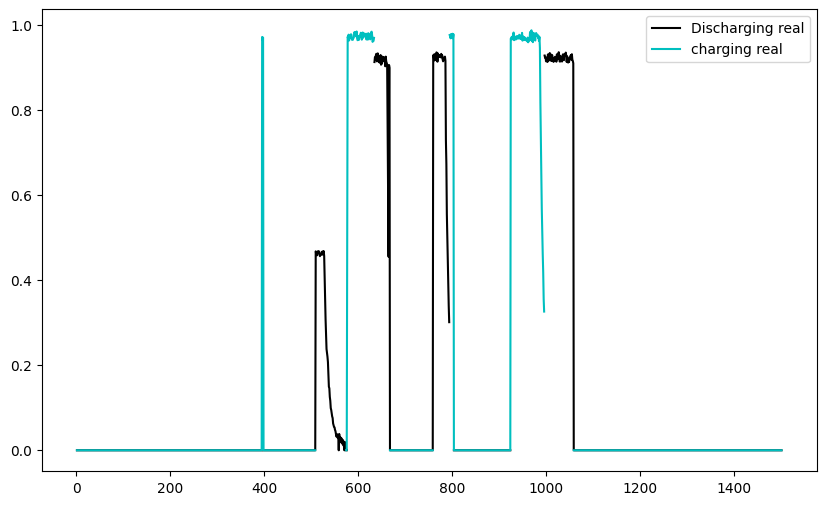

In [ ]:
plt.figure(figsize=(10, 6))

# Plotting daily desired discharging and real discharging
plt.plot(np.arange(1,1501), discharging_real[68400+5000:68400+6500], 'k', label='Discharging real')
plt.plot(np.arange(1,1501), charging_real[68400+5000:68400+6500]*-1, 'c', label='charging real')
plt.legend()
plt.show()
# dohrat sa s trendami potom tu

In [ ]:
len(df_resampled)

136801

IX. Weekly seasonality

In [ ]:
# same principle as for daily. There are two ways of how to do it (by days - every monday...) or by weeks (1st, 2nd,...)
# new data frame

# For each column we initialise a corresponding vector number of elements of which is the number of days between 21.2 and 26.5. (and that is 13).
fan_weekly_sum = np.zeros(14)
heating_weekly_sum = np.zeros(14)
cooling_weekly_sum = np.zeros(14)
fan_b_weekly_mean = np.zeros(14)
power_setpoint_weekly_mean = np.zeros(14)
SOC_weekly_mean = np.zeros(14)
avg_temperature_weekly_mean = np.zeros(14)
max_temperature_weekly_mean = np.zeros(14)
min_temperature_weekly_mean = np.zeros(14)
string_power_weekly_mean = np.zeros(14)
outside_temperature_weekly_mean = np.zeros(14)
ambient_temperature_weekly_mean = np.zeros(14)
desired_discharging_weekly_mean = np.zeros(14)
desired_charging_weekly_mean = np.zeros(14)
real_discharging_weekly_mean = np.zeros(14)
real_charging_weekly_mean = np.zeros(14)


# After every 7 data we do given aggregating operation (sum or mean, depends on whether we are transforming binary or numeric data). This sum or mean value is then written into above initialised vector.
a = 0
b = 0
i = 0

for index in df_daily.index:
  i+=1
  if i % 7 == 0:
    fan_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part Circulation Fan V1'][a:a+7].aggregate(sum)
    heating_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part heating'][a:a+7].aggregate(sum)
    cooling_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part cooling'][a:a+7].aggregate(sum)
    fan_b_weekly_mean[b] = df_daily['Daily mean of HVAC Battery part Circulation Fan V1b Feedback'][a:a+7].aggregate('mean')
    power_setpoint_weekly_mean[b] = df_daily['Daily mean of Active Power Setpoint'][a:a+7].aggregate('mean')
    SOC_weekly_mean[b] = df_daily['Daily mean of SOC'][a:a+7].aggregate('mean')
    avg_temperature_weekly_mean[b] = df_daily['Daily mean of Avg. Cell Temperature'][a:a+7].aggregate('mean')
    max_temperature_weekly_mean[b] = df_daily['Daily mean of Max. Cell Temperature'][a:a+7].aggregate('mean')
    min_temperature_weekly_mean[b] = df_daily['Daily mean of Min. Cell Temperature'][a:a+7].aggregate('mean')
    string_power_weekly_mean[b] = df_daily['Daily mean of String Power'][a:a+7].aggregate('mean')
    outside_temperature_weekly_mean[b] = df_daily['Daily mean of Outside Temperature'][a:a+7].aggregate('mean')
    ambient_temperature_weekly_mean[b] = df_daily['Daily mean of Ambient Temperature'][a:a+7].aggregate('mean')
    desired_discharging_weekly_mean[b] = df_daily['Daily mean of Desired dicharging'][a:a+7].aggregate('mean')
    real_discharging_weekly_mean[b] = df_daily['Daily mean of Real discharging'][a:a+7].aggregate('mean')
    real_charging_weekly_mean[b] = df_daily['Daily mean of Real charging'][a:a+7].aggregate('mean')
    desired_charging_weekly_mean[b] = df_daily['Daily mean of Desired charging'][a:a+7].aggregate('mean')

    a += 7
    b += 1
  # remaining days
  elif len(df_daily)-a<7:

    fan_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part Circulation Fan V1'][a:len(df_daily)].aggregate(sum)
    heating_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part heating'][a:len(df_daily)].aggregate(sum)
    cooling_weekly_sum[b] = df_daily['Daily sum of HVAC Battery part cooling'][a:len(df_daily)].aggregate(sum)
    fan_b_weekly_mean[b] = df_daily['Daily mean of HVAC Battery part Circulation Fan V1b Feedback'][a:len(df_daily)].aggregate('mean')
    power_setpoint_weekly_mean[b] = df_daily['Daily mean of Active Power Setpoint'][a:len(df_daily)].aggregate('mean')
    SOC_weekly_mean[b] = df_daily['Daily mean of SOC'][a:len(df_daily)].aggregate('mean')
    avg_temperature_weekly_mean[b] = df_daily['Daily mean of Avg. Cell Temperature'][a:len(df_daily)].aggregate('mean')
    max_temperature_weekly_mean[b] = df_daily['Daily mean of Max. Cell Temperature'][a:len(df_daily)].aggregate('mean')
    min_temperature_weekly_mean[b] = df_daily['Daily mean of Min. Cell Temperature'][a:len(df_daily)].aggregate('mean')
    string_power_weekly_mean[b] = df_daily['Daily mean of String Power'][a:len(df_daily)].aggregate('mean')
    outside_temperature_weekly_mean[b] = df_daily['Daily mean of Outside Temperature'][a:len(df_daily)].aggregate('mean')
    ambient_temperature_weekly_mean[b] = df_daily['Daily mean of Ambient Temperature'][a:len(df_daily)].aggregate('mean')
    desired_discharging_weekly_mean[b] = df_daily['Daily mean of Desired dicharging'][a:len(df_daily)].aggregate('mean')
    real_discharging_weekly_mean[b] = df_daily['Daily mean of Real discharging'][a:len(df_daily)].aggregate('mean')
    real_charging_weekly_mean[b] = df_daily['Daily mean of Real charging'][a:len(df_daily)].aggregate('mean')
    desired_charging_weekly_mean[b] = df_daily['Daily mean of Desired charging'][a:len(df_daily)].aggregate('mean')

days_off = len(df_daily)-a-1

In [ ]:
a

91

In [ ]:
print(b)

13


In [ ]:
start_time = '2022-02-21'
end_time = '2022-05-21'

# Setting the interval period
time_interval = '7D'

# Generation of a range of timestamps with the specified interval (later used as the index)
time_range = pd.date_range(start=start_time, end=end_time, freq=time_interval)
time_range = np.arange(1,15)

# New data frame with its first column
fan_v1_sum_2 = {'Weekly sum of HVAC Battery part Circulation Fan V1': fan_weekly_sum}

# Addition of the rest columns
df_weeky = pd.DataFrame(fan_v1_sum_2, index=time_range)
df_weeky['Weekly sum of HVAC Battery part heating'] = heating_weekly_sum
df_weeky['Weekly sum of HVAC Battery part cooling'] = cooling_weekly_sum
df_weeky['Weekly sum of HVAC Battery part Circulation Fan V1b Feedback'] = fan_b_weekly_mean
df_weeky['Weekly mean of Active Power Setpoint'] = cooling_weekly_sum
df_weeky['Weekly mean of SOC'] = SOC_weekly_mean
df_weeky['Weekly mean of Avg. Cell Temperature'] = avg_temperature_weekly_mean
df_weeky['Weekly mean of Max. Cell Temperature'] = max_temperature_weekly_mean
df_weeky['Weekly mean of Min. Cell Temperature'] = min_temperature_weekly_mean
df_weeky['Weekly mean of String Power'] = string_power_weekly_mean
df_weeky['Weekly mean of Outside Temperature'] = outside_temperature_weekly_mean
df_weeky['Weekly mean of Ambient Temperature'] = ambient_temperature_weekly_mean
df_weeky['Weekly mean of Desired dicharging'] = desired_discharging_weekly_mean
df_weeky['Weekly mean of Desired charging'] = desired_charging_weekly_mean
df_weeky['Weekly mean of Real discharging'] = real_discharging_weekly_mean
df_weeky['Weekly mean of Real charging'] = real_charging_weekly_mean

# Result
df_weeky

,Weekly sum of HVAC Battery part Circulation Fan V1,Weekly sum of HVAC Battery part heating,Weekly sum of HVAC Battery part cooling,Weekly sum of HVAC Battery part Circulation Fan V1b Feedback,Weekly mean of Active Power Setpoint,Weekly mean of SOC,Weekly mean of Avg. Cell Temperature,Weekly mean of Max. Cell Temperature,Weekly mean of Min. Cell Temperature,Weekly mean of String Power,Weekly mean of Outside Temperature,Weekly mean of Ambient Temperature,Weekly mean of Desired dicharging,Weekly mean of Desired charging,Weekly mean of Real discharging,Weekly mean of Real charging
1,912.0,1.0,911.0,0.000000,911.0,0.665940,0.637706,0.654711,0.617320,-0.006033,0.233762,0.602479,0.015089,-0.019929,0.012492,-0.018932
2,1191.0,274.0,975.0,0.005233,975.0,0.408921,0.640356,0.658504,0.621072,0.001296,0.189660,0.599045,0.009037,-0.006300,0.007394,-0.005953
3,4781.0,4094.0,80.0,0.007948,80.0,0.762670,0.594763,0.619624,0.542236,0.002628,0.195672,0.258001,0.025630,-0.020991,0.022142,-0.019384
4,5474.0,4419.0,224.0,0.046959,224.0,0.666151,0.579645,0.607700,0.515463,-0.000317,0.252698,0.255376,0.040957,-0.040869,0.034494,-0.034607
5,3190.0,2895.0,16.0,0.009294,16.0,0.848194,0.586907,0.610477,0.539583,0.001336,0.321559,0.314415,0.001607,0.000000,0.001336,0.000000
6,3521.0,2998.0,16.0,0.000000,16.0,0.821909,0.590845,0.615958,0.529975,0.000000,0.291137,0.293767,0.000000,0.000000,0.000000,0.000000
7,4908.0,1463.0,373.0,0.175630,373.0,0.693743,0.627394,0.649717,0.584231,0.001333,0.298308,0.421084,0.012907,-0.013350,0.011975,-0.010795
8,5826.0,2660.0,368.0,0.055361,368.0,0.722793,0.613596,0.642013,0.581392,0.002179,0.310569,0.474391,0.029366,-0.023757,0.023907,-0.022469
9,8326.0,4325.0,52.0,0.000000,52.0,0.778255,0.584949,0.619674,0.550482,0.001132,0.307847,0.476241,0.007821,-0.006118,0.006702,-0.005586
10,4682.0,529.0,1048.0,0.052081,1048.0,0.651428,0.650558,0.677888,0.616485,0.001254,0.362748,0.477546,0.062909,-0.136043,0.026479,-0.025347


Weekly based on days

In [ ]:
#Monday starting day, Thursady is the last day


# After every 7 data we do given aggregating operation (sum or mean, depends on whether we are transforming binary or numeric data). This sum or mean value is then written into above initialised vector.
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
data = {'Value': [1, 2, 3, 4, 5, 6, 7]}
df_daily_names = pd.DataFrame(data, index=pd.Index(weekday_names, name='Week day'))

for i in range(0,7):
  fan_weekly_sum = df_daily['Daily sum of HVAC Battery part Circulation Fan V1'][i:len(df_daily)-days_off-(7-i):7].aggregate(sum)
  heating_weekly_sum = df_daily['Daily sum of HVAC Battery part heating'][i:len(df_daily)-days_off-(7-i):7].aggregate(sum)
  cooling_weekly_sum = df_daily['Daily sum of HVAC Battery part cooling'][i:len(df_daily)-days_off-(7-i):7].aggregate(sum)
  fan_b_weekly_mean = df_daily['Daily mean of HVAC Battery part Circulation Fan V1b Feedback'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  power_setpoint_weekly_mean = df_daily['Daily mean of Active Power Setpoint'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  SOC_weekly_mean = df_daily['Daily mean of SOC'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  avg_temperature_weekly_mean = df_daily['Daily mean of Avg. Cell Temperature'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  max_temperature_weekly_mean = df_daily['Daily mean of Max. Cell Temperature'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  min_temperature_weekly_mean = df_daily['Daily mean of Min. Cell Temperature'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  string_power_weekly_mean = df_daily['Daily mean of String Power'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  outside_temperature_weekly_mean = df_daily['Daily mean of Outside Temperature'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  ambient_temperature_weekly_mean = df_daily['Daily mean of Ambient Temperature'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  desired_discharging_weekly_mean = df_daily['Daily mean of Desired dicharging'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  real_discharging_weekly_mean = df_daily['Daily mean of Real discharging'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  real_charging_weekly_mean = df_daily['Daily mean of Real charging'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')
  desired_charging_weekly_mean = df_daily['Daily mean of Desired charging'][i:len(df_daily)-days_off-(7-i):7].aggregate('mean')

  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'HVAC Battery part Circulation Fan V1'] = fan_weekly_sum
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'HVAC Battery part heating'] = heating_weekly_sum
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'HVAC Battery part cooling'] = cooling_weekly_sum
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'HVAC Battery part Circulation Fan V1b Feedback'] = fan_b_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Active Power Setpoint'] = power_setpoint_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'SOC'] = SOC_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Avg. Cell Temperature'] = avg_temperature_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Max. Cell Temperature'] = max_temperature_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Min. Cell Temperature'] = min_temperature_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'String Power'] = string_power_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Outside Temperature'] = outside_temperature_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Ambient Temperature'] = ambient_temperature_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Desired dicharging'] = desired_discharging_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Desired charging'] = desired_charging_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Real discharging'] = real_discharging_weekly_mean
  df_daily_names.loc[df_daily_names.index == df_daily_names.index[i],'Real charging'] = real_charging_weekly_mean
df_daily_names = df_daily_names.drop('Value', axis=1)


In [ ]:
df_daily_names

,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,HVAC Battery part Circulation Fan V1b Feedback,Active Power Setpoint,SOC,Avg. Cell Temperature,Max. Cell Temperature,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature,Desired dicharging,Desired charging,Real discharging,Real charging
Week day,,,,,,,,,,,,,,,,
Monday,6576.0,3171.0,665.0,0.067433,51.153846,0.748511,0.601651,0.628460,0.564898,0.000091,0.293206,0.417040,0.022801,-0.022115,0.018195,-0.018572
Tuesday,5669.0,2521.0,967.0,0.021552,74.384615,0.757657,0.606180,0.631622,0.571364,-0.003403,0.318374,0.414516,0.027175,-0.026602,0.022798,-0.025741
Wednesday,5948.0,2388.0,1224.0,0.009284,94.153846,0.696065,0.604712,0.630854,0.565642,-0.000634,0.321711,0.427002,0.025491,-0.023535,0.020678,-0.021934
Thursday,7232.0,3836.0,866.0,0.028055,66.615385,0.711649,0.604301,0.631565,0.564456,0.000949,0.321453,0.426905,0.011358,-0.010350,0.009680,-0.008704
Friday,8279.0,3677.0,921.0,0.015382,70.846154,0.715314,0.606493,0.635889,0.563533,0.000858,0.318011,0.436421,0.014789,-0.022115,0.012939,-0.012216
Saturday,7864.0,3928.0,501.0,0.028579,38.538462,0.743710,0.611217,0.639995,0.567485,0.000942,0.307320,0.423910,0.026094,-0.057870,0.008600,-0.007702
Sunday,7278.0,4429.0,290.0,0.019527,22.307692,0.759515,0.597462,0.625811,0.557726,0.000406,0.299167,0.411762,0.000681,0.000000,0.000406,0.000000


Rendering weekly seasonality

<ipython-input-140-0879d9101d93>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


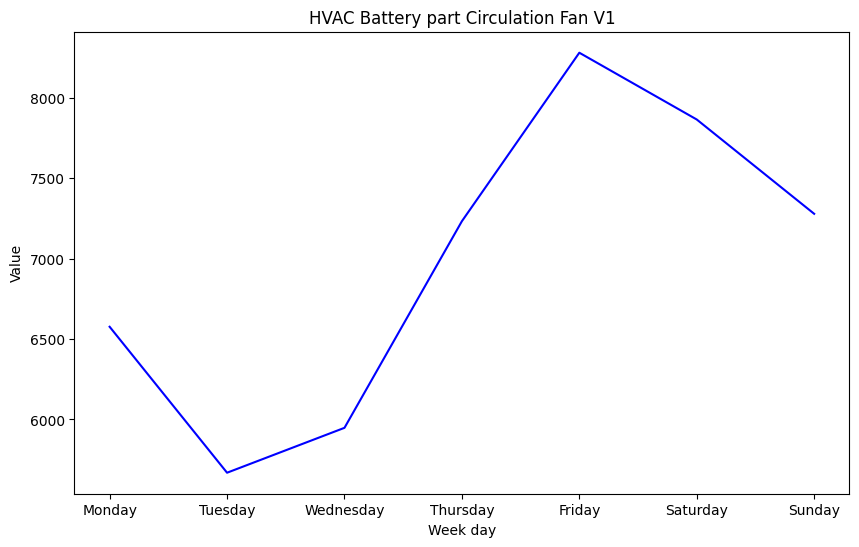

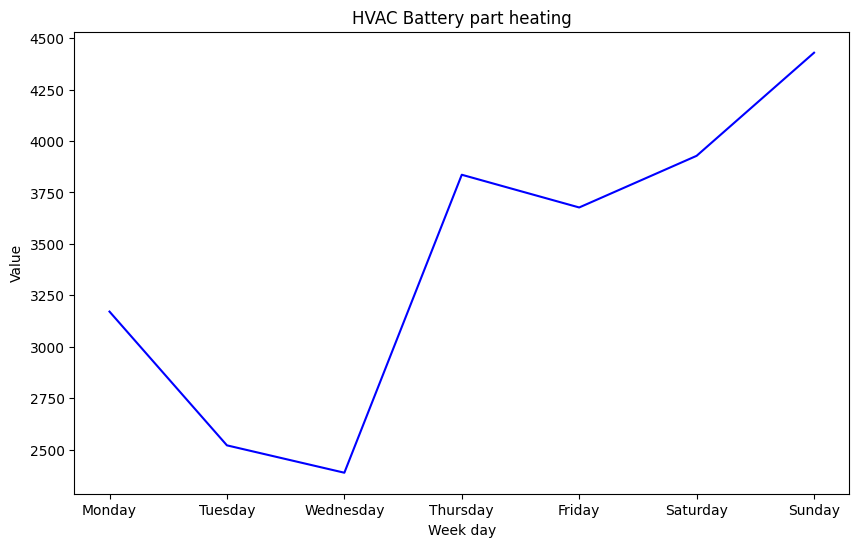

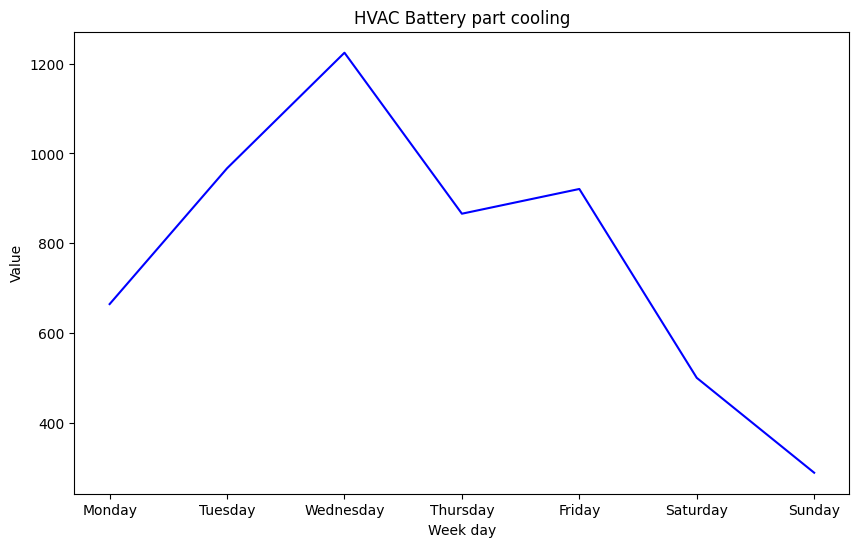

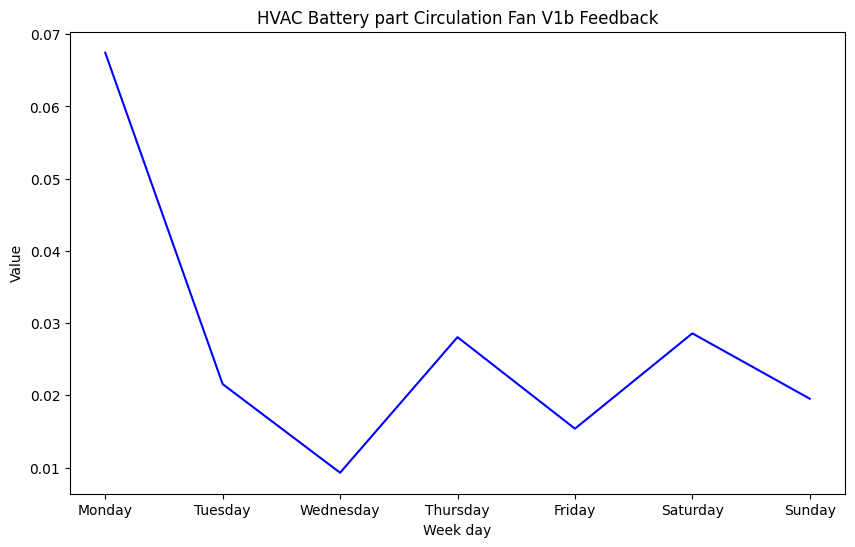

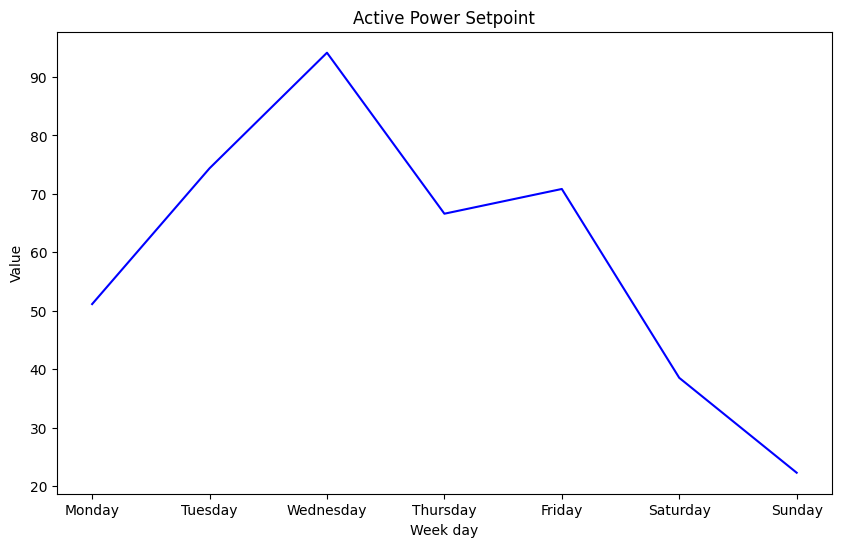

...

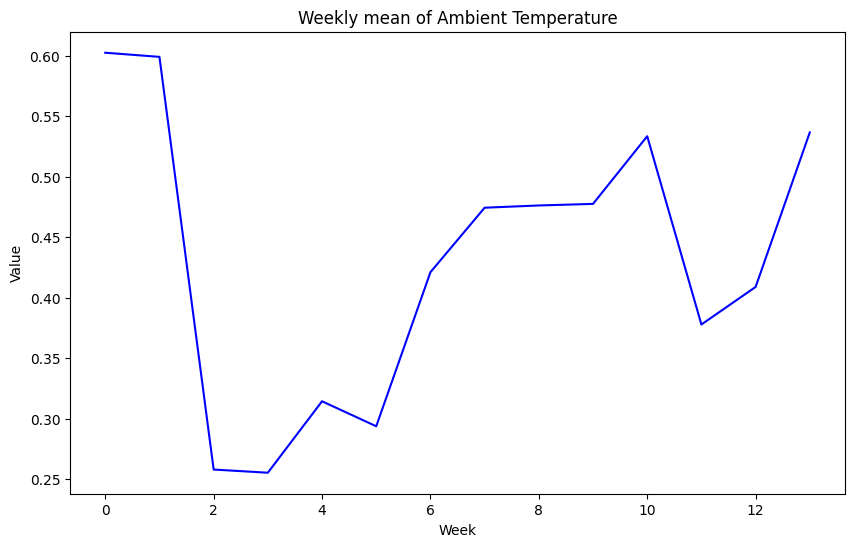

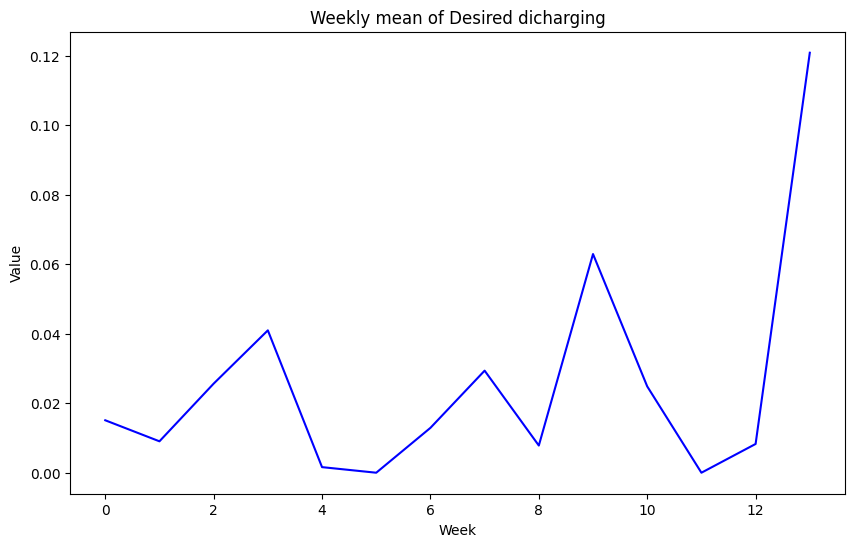

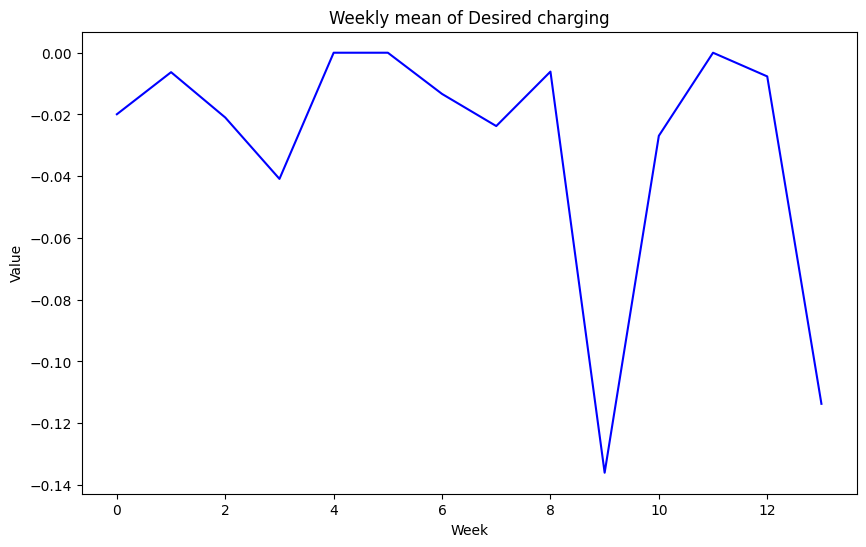

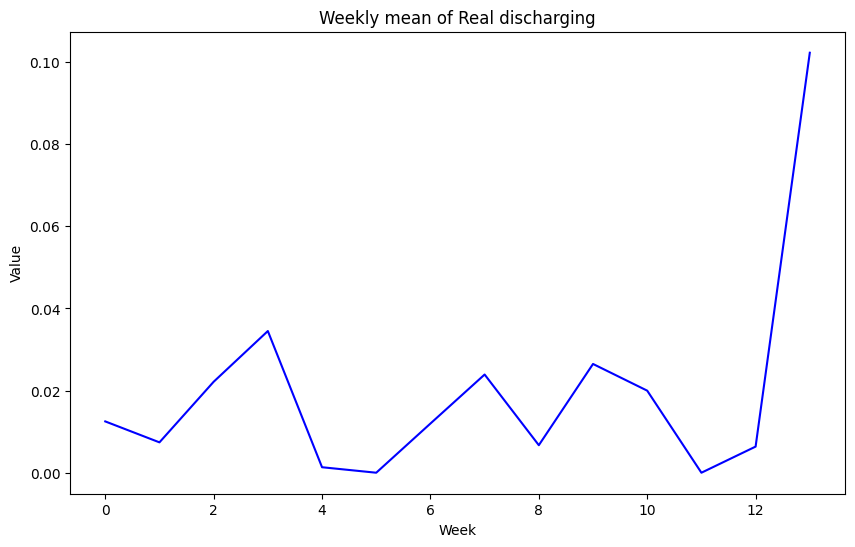

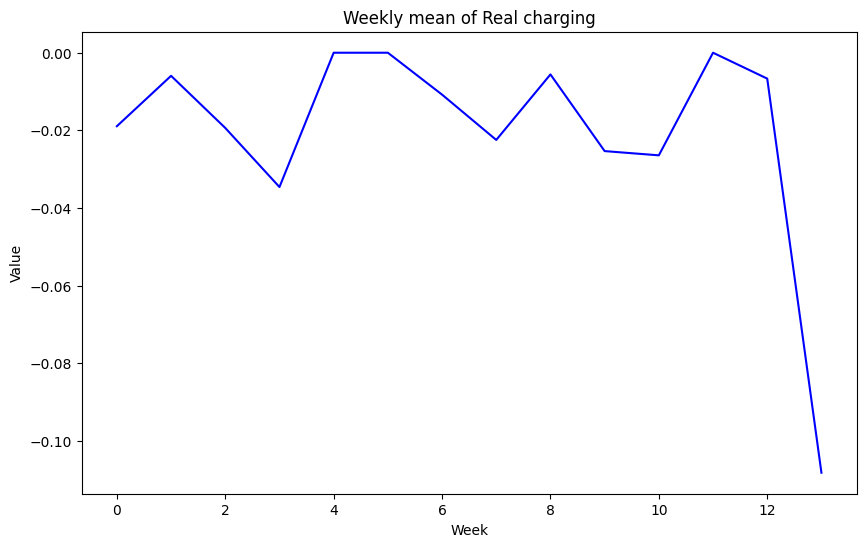

In [ ]:
# Plotting daily charging and discharging
i = 0
for column_name in df_daily_names.columns:
  plt.figure(figsize=(10, 6))
  plt.plot(weekday_names, df_daily_names[column_name], 'b', label=column_name)
  plt.xlabel('Week day')
  plt.ylabel('Value')
  plt.title(column_name)

for column_name in df_weeky.columns:
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(len(df_weeky)), df_weeky[column_name], 'b', label=column_name)
  plt.xlabel('Week')
  plt.ylabel('Value')
  plt.title(column_name)

# X. HVAC errors  

In this task we are going to analyze relations between HVAC parameters and features that somehow characterise battery's state. We will provide correlation coefficients beween each pair: HVAC - battery's state. Those ones were correlation (positive or negative will be observed) will be then analysed more in detail. We will analyze HVAC errors in them - when HVAC change didn't cause change in given battery's state.  

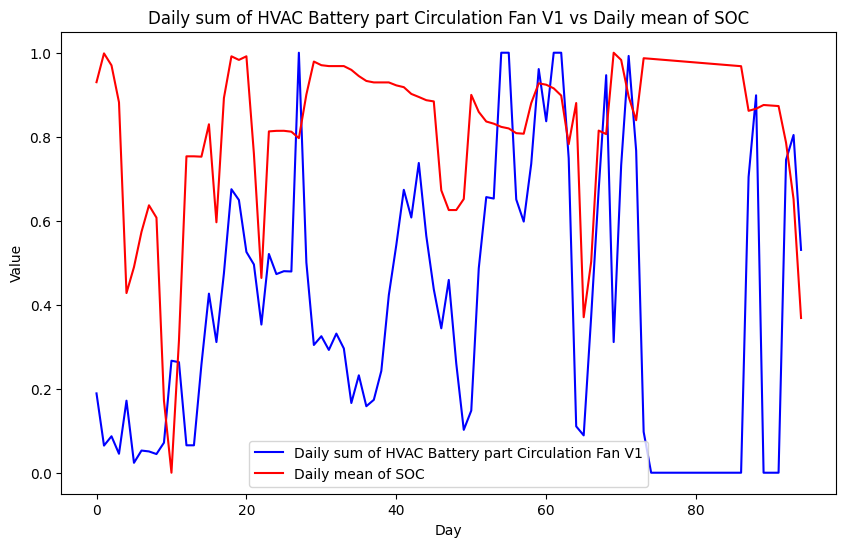

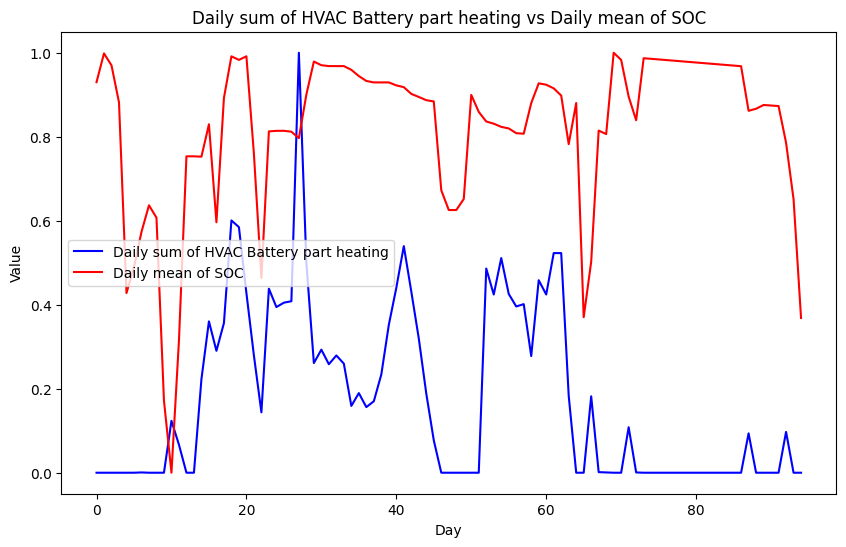

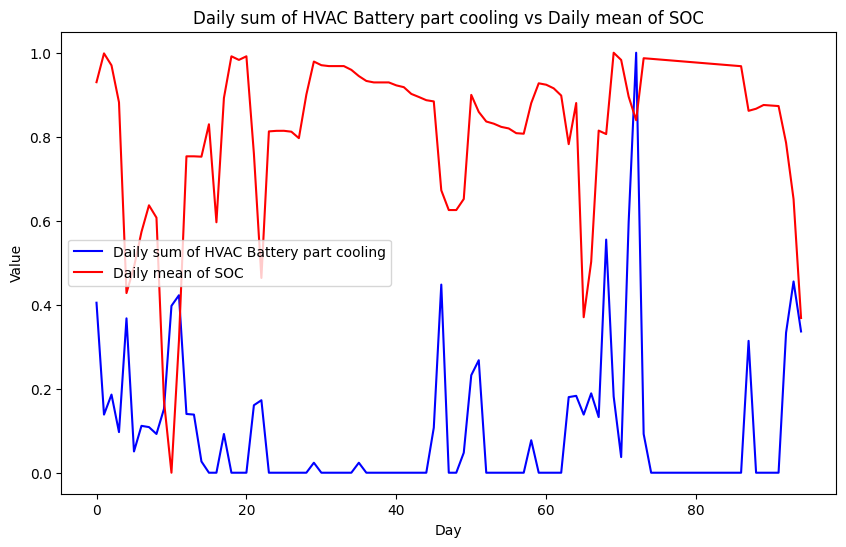

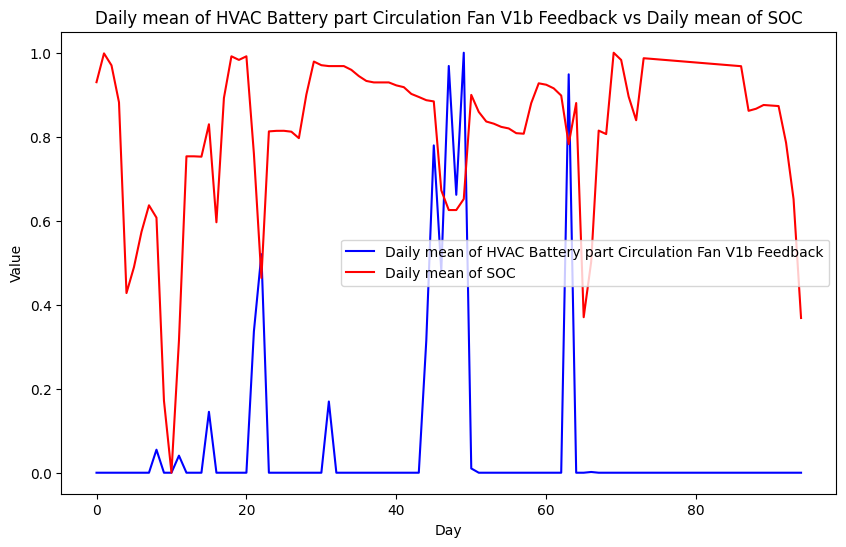

In [ ]:
# SOC vs HVAC states - not neccessary
for column_name in df_daily.columns[0:4]:
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(len(df_daily)), (df_daily[column_name]-min(df_daily[column_name]))/(max(df_daily[column_name])-min(df_daily[column_name])), 'b', label=column_name)
  plt.plot(np.arange(len(df_daily)), (df_daily[df_daily.columns[5]]-min(df_daily[df_daily.columns[5]]))/(max(df_daily[df_daily.columns[5]])-min(df_daily[df_daily.columns[5]])), 'r', label=df_daily.columns[5])
  plt.xlabel('Day')
  plt.ylabel('Value')
  plt.title(column_name + ' vs ' + df_daily.columns[5])
  plt.legend()

Concusion for SOC - very weak impact of HVACs on SOC

HVAC features - when some of the HVAC feature is switched on or off (when there's a change), this fact should somehow show of - some of battery's states needs to change. F.ex. if cooling is switched on, cell temperature of battery should rise. Our task is to find situations in which HVAC feature changed but no battery system did (anomaly, or drift...)

At first we will depict change points out of all HVACs and change points out of whole battery system states

In [ ]:
# Now we are going to find data points for HVAC inputs which caused no change in none of outputs That is a straight sign that there must be either drift or anomaly (otherwise some change on the outputs would have been made)

data_states = ['SOC','Battery part Fan Vb1 Feedback', 'String Power', 'Desired charging', 'Real discharging', 'Real charging','Active Power Setpoint','Avg. Cell Temperature', 'Ambient Temperature','Max. Cell Temperatue', 'Min. Cell Temperature'] #states
binary_features = ['HVAC Battery part Circulation Fan V1', 'HVAC Battery part heating', 'HVAC Battery part cooling'] #inputs

a=0

indices_features = np.zeros(len(df_resampled.index)) #initialization - we put there whole data frame and then we remove zero values

# in the first step we find indices of those data belonging to HVAC features which are followed by different value (there comes to change)
for feature in binary_features:
  for i in range(0,len(df_resampled.index)-1):
    if df_resampled.at[df_resampled.index[i], feature] != df_resampled.at[df_resampled.index[i+1], feature] and i not in indices_features:
      indices_features[a] = i
      a+=1
indices_features = [x for x in indices_features if x != 0] #removal of zeros

# Now we do the same for states - again, we are collecting indices of those data points which are followed by different value (not the same one)...
a=0
indices_states = np.zeros(len(df_resampled.index))
for state in data_states:
  for i in range(0,len(df_resampled.index)-1):
    if df_resampled.at[df_resampled.index[i], state] != df_resampled.at[df_resampled.index[i+1], state] and i not in indices_states:
      indices_states[a] = i
      #print(a)
      a+=1
indices_states = [x for x in indices_states if x != 0]


In [ ]:
result = [x for x in indices_features if x not in indices_states] #comparison of these two vectors (features and states) and selecting only those indices out of feature_indices, features of which didn't cause the change it any of the states indices
print(len(result)) #indices of these HVAC error points in HVACs when putted together (heating, cooling,fan)

#percentual number of these incorrect (anomalies, drift...)
percentage = len(result)/len(indices_features)*100 #percentual number of those change points which didnt cause any change
print(percentage)

# Here we can start to speculate about the relations between HVACS features and battery states - what influences what... what would happen if we didn't count with some of the states - how would the percentage increased if we didn't include that one... For example if we counted as only with temperatures and soc system states, in pocet variable would be only three more points. That represents the fact that these excluded features are not more influenced by the HVACS inputs than temperatures are. If we do it oppositely - we exclude temperatures and now we look on how do HVACS influence these other states, we would get value of 1884 - rise of the percentage error in 74%.
# Conclusion - HVACS affect mainly temperatures, not charging

67
2.719155844155844


In [ ]:
# we create it so we can then later plot it - thats why we use NaNs...
new_vector = np.full(len(indices_features), np.nan)
for i in range(len(indices_features)):
  if indices_features[i] in result :
    new_vector[i] = indices_features[i]



Text(0.5, 1.0, 'Indices of Change points between HVAC binary features and battery states')

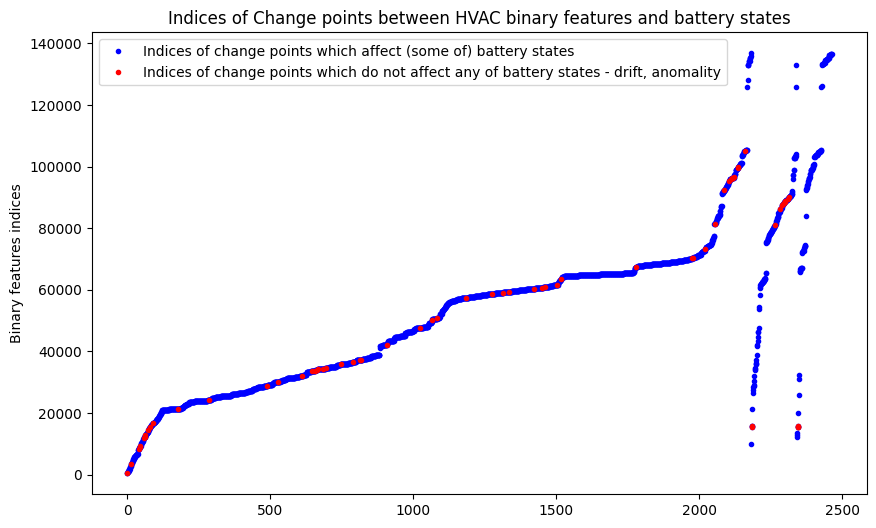

In [ ]:
# highlighting change point indices
plt.figure(figsize=(10, 6))
plt.plot(np.arange(0,len(indices_features)), indices_features, '.b', label='Indices of change points which affect (some of) battery states')
plt.plot(np.arange(0,len(indices_features)), new_vector, 'r.', label='Indices of change points which do not affect any of battery states - drift, anomality')
plt.ylabel('Binary features indices')
plt.legend()
plt.title('Indices of Change points between HVAC binary features and battery states')

Explanation: The red point show us indices of change points for dataset containing given selected battery states. The number of blue data represent the number of switch-ons/switch offs. The steeper the chart is the less switchons/offs occured. Those three sections (lines) (the border between the first and second one is around x=2100) represent three binary HVAC features. The decrease of values marks the fact that they are not always switched on/off at the same time... (for example HVAC cooling (third line) has switchons/offs also there where HVAC heating and fan V1 dont).

Now let's look on regression relations between selected pairs of battery HVAC feature and battery state. Our goal is to find correlations between each pair and by that conclude which features influence which states.

We will compare resampled_df (sampling period 1M) with df with sampling period of one day (df_daily)

Parity plots

In [ ]:
data_states_daily = ['Daily mean of HVAC Battery part Circulation Fan V1b Feedback', 'Daily mean of SOC', 'Daily mean of Avg. Cell Temperature', 'Daily mean of Max. Cell Temperature', 'Daily mean of Min. Cell Temperature', 'Daily mean of String Power',  'Daily mean of Ambient Temperature', 'Daily mean of Active Power Setpoint']
binary_features_daily = ['Daily sum of HVAC Battery part Circulation Fan V1', 'Daily sum of HVAC Battery part heating', 'Daily sum of HVAC Battery part cooling']
data_states = ['Battery part Fan Vb1 Feedback', 'SOC', 'Avg. Cell Temperature', 'Max. Cell Temperature', 'Min. Cell Temperature', 'String Power',  'Ambient Temperature', 'Active Power Setpoint']
binary_features = ['HVAC Battery part Circulation Fan V1', 'HVAC Battery part heating', 'HVAC Battery part cooling']

Correlation coefficient for Battery part Fan Vb1 Feedback vs HVAC Battery part Circulation Fan V1 equals -0.0418145038217679
Correlation coefficient for Battery part Fan Vb1 Feedback vs HVAC Battery part heating equals -0.07487140190894634
Correlation coefficient for Battery part Fan Vb1 Feedback vs HVAC Battery part cooling equals -0.031453970101469664
Correlation coefficient for SOC vs HVAC Battery part Circulation Fan V1 equals -0.007306183531587543
Correlation coefficient for SOC vs HVAC Battery part heating equals 0.0773793139773934
Correlation coefficient for SOC vs HVAC Battery part cooling equals -0.17518930305868338
Correlation coefficient for Avg. Cell Temperature vs HVAC Battery part Circulation Fan V1 equals -0.10127809994565339
Correlation coefficient for Avg. Cell Temperature vs HVAC Battery part heating equals -0.2861332679084074
Correlation coefficient for Avg. Cell Temperature vs HVAC Battery part cooling equals 0.14152504814052022
Correlation coefficient for Min. Cell

<ipython-input-147-6305fb154456>:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


104442
Correlation coefficient for Daily mean of Max. Cell Temperature vs Daily sum of HVAC Battery part cooling equals 0.5502094293649339
104442
Correlation coefficient for Daily mean of Min. Cell Temperature vs Daily sum of HVAC Battery part Circulation Fan V1 equals -0.24703141711992446
104442
Correlation coefficient for Daily mean of Min. Cell Temperature vs Daily sum of HVAC Battery part heating equals -0.6093857674489422
104442
Correlation coefficient for Daily mean of Min. Cell Temperature vs Daily sum of HVAC Battery part cooling equals 0.40793770805033097
104442
Correlation coefficient for Daily mean of String Power vs Daily sum of HVAC Battery part Circulation Fan V1 equals -0.04447365117668302
104442
Correlation coefficient for Daily mean of String Power vs Daily sum of HVAC Battery part heating equals 0.05232898535022115
104442
Correlation coefficient for Daily mean of String Power vs Daily sum of HVAC Battery part cooling equals -0.12231575710466287
104442
Correlation coef

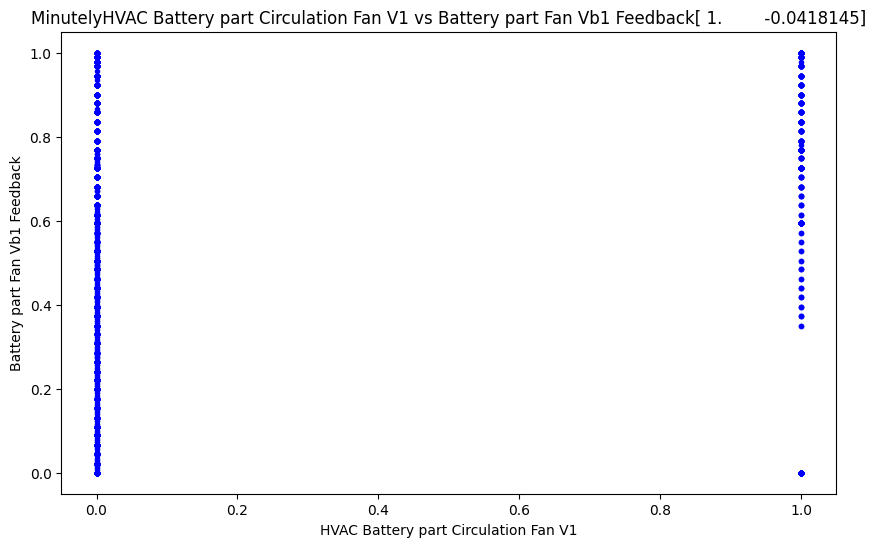

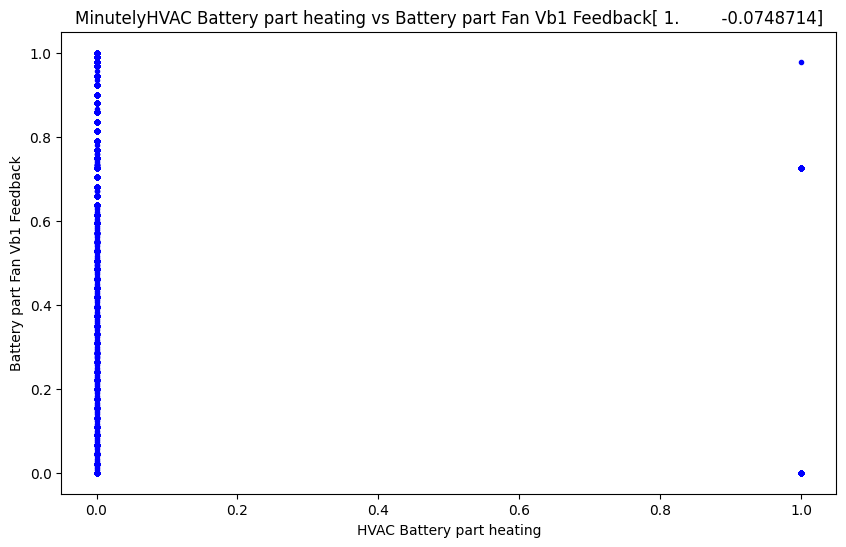

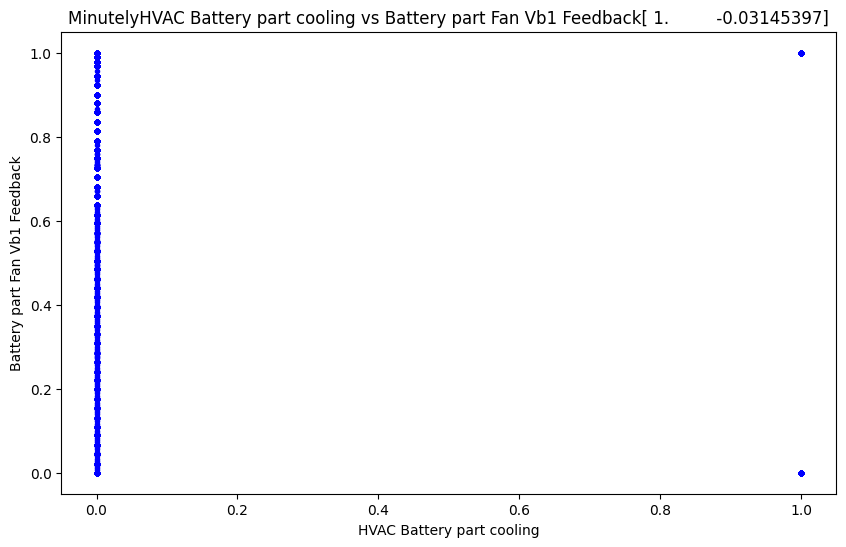

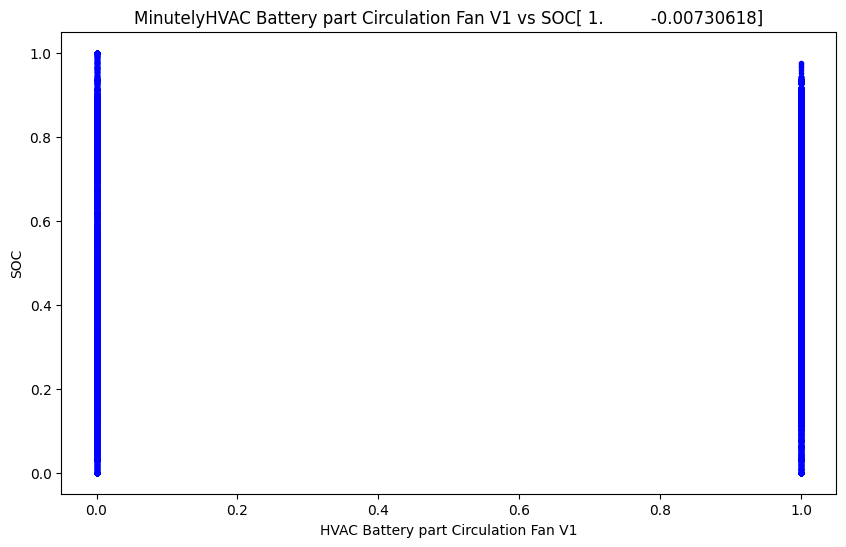

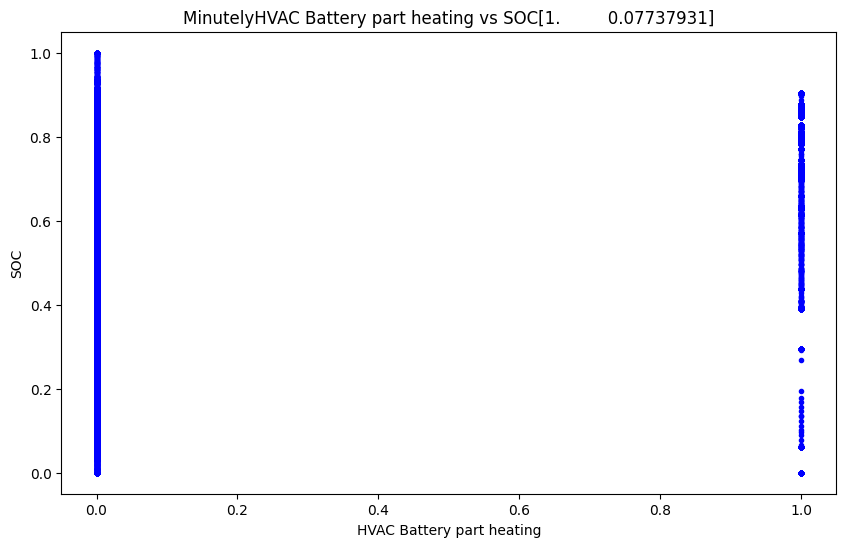

...

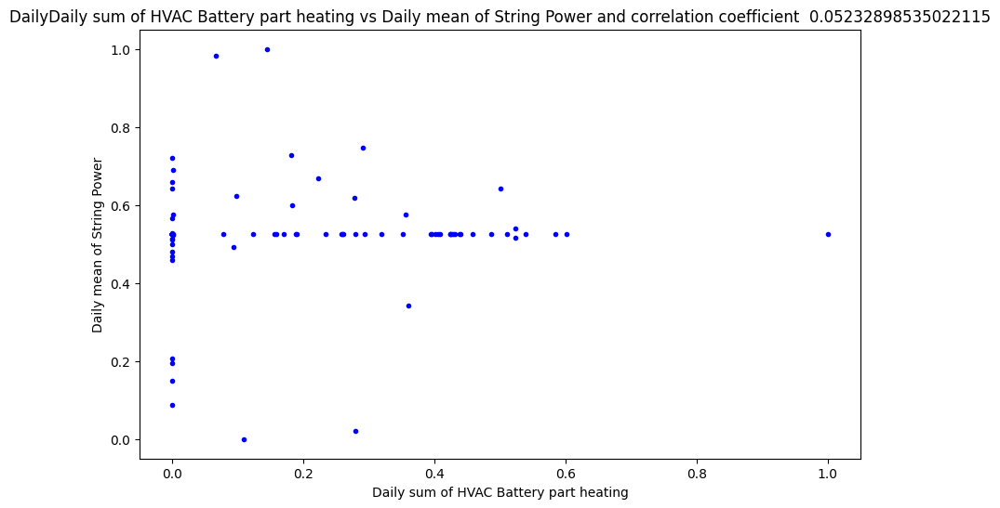

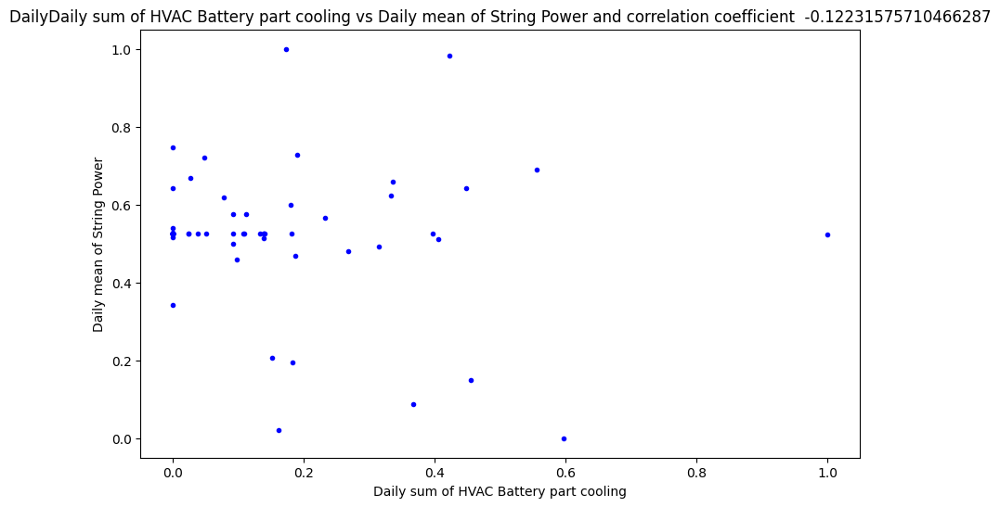

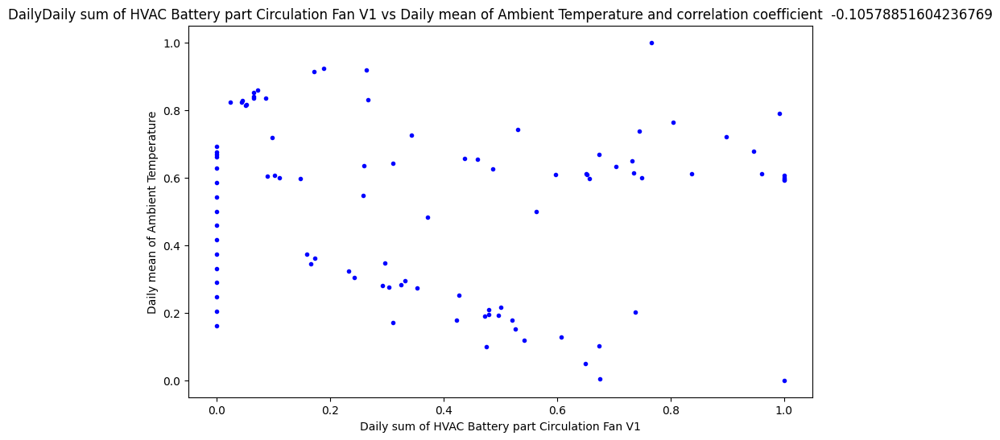

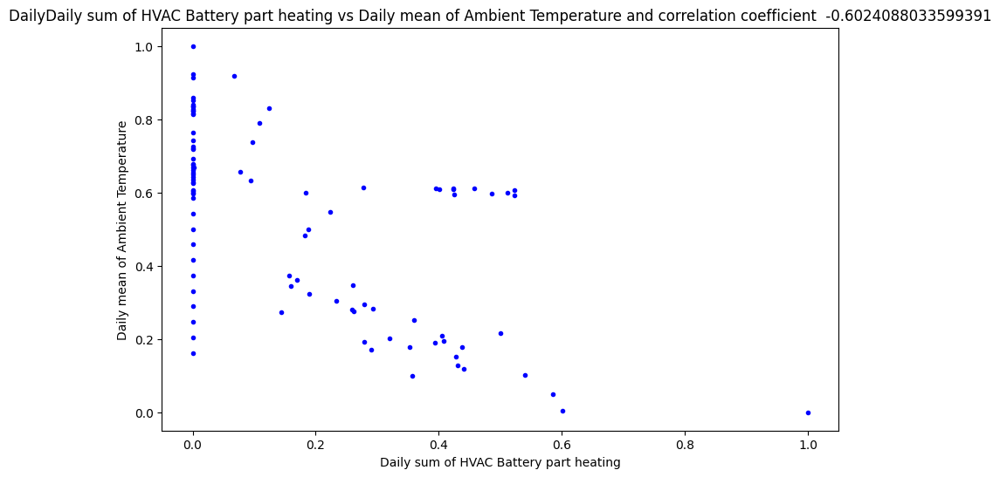

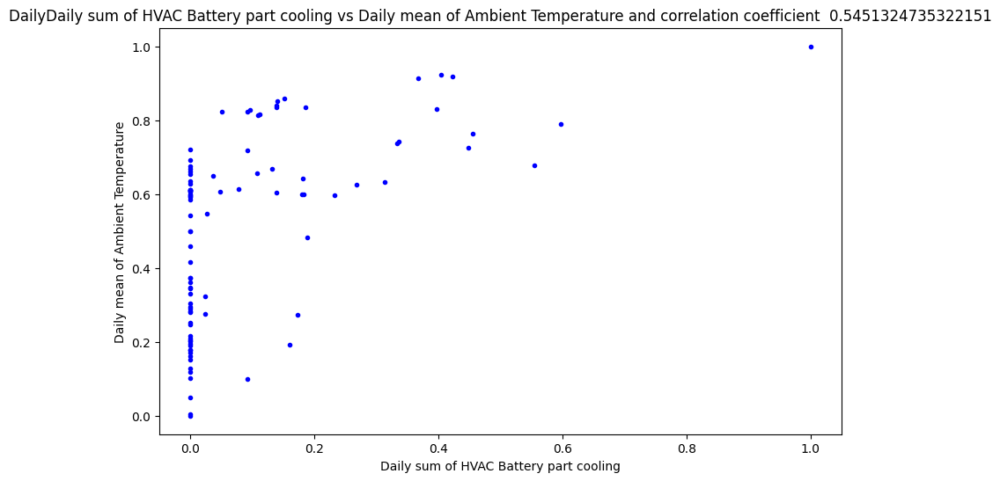

In [ ]:
data_states_daily = ['Daily mean of HVAC Battery part Circulation Fan V1b Feedback', 'Daily mean of SOC', 'Daily mean of Avg. Cell Temperature', 'Daily mean of Max. Cell Temperature', 'Daily mean of Min. Cell Temperature', 'Daily mean of String Power',  'Daily mean of Ambient Temperature', ]
binary_features_daily = ['Daily sum of HVAC Battery part Circulation Fan V1', 'Daily sum of HVAC Battery part heating', 'Daily sum of HVAC Battery part cooling']
data_states = ['Battery part Fan Vb1 Feedback', 'SOC', 'Avg. Cell Temperature', 'Min. Cell Temperature', 'String Power',  'Ambient Temperature']
binary_features = ['HVAC Battery part Circulation Fan V1', 'HVAC Battery part heating', 'HVAC Battery part cooling']

#polarity chart, both variables are normalised. On x-axis is HVACS variable
correlated_features_minutely = []
correlated_states_minutely = []
correlation_coef_list_minutely = []
for state in data_states:
  for feature in binary_features:
      plt.figure(figsize=(10, 6))
      plt.plot((df_resampled[feature]-min(df_resampled[feature]))/(max(df_resampled[feature])-min(df_resampled[feature])), ((df_resampled[state]-min(df_resampled[state]))/(max(df_resampled[state])-min(df_resampled[state]))), 'b.', label=feature + ' vs ' +state)
      correlation_coefficient = np.corrcoef((df_resampled[feature]-min(df_resampled[feature]))/(max(df_resampled[feature])-min(df_resampled[feature])), ((df_resampled[state]-min(df_resampled[state]))/(max(df_resampled[state])-min(df_resampled[state]))))[0]
      plt.xlabel(feature)
      plt.ylabel(state)
      plt.title('Minutely' + feature + ' vs ' +state+ str(correlation_coefficient))

      normalised_feature = (df_resampled[feature]-min(df_resampled[feature]))/(max(df_resampled[feature])-min(df_resampled[feature]))
      normalised_state = (df_resampled[state]-min(df_resampled[state]))/(max(df_resampled[state])-min(df_resampled[state]))
      correlation_coef = np.corrcoef([normalised_feature], [normalised_state])[0,1]
      if abs(correlation_coef) > 0.5: #if correlation between given variables is at least 0.5 then we will save these features into vectors and later work with them
        correlated_features_minutely.append(feature)
        correlated_states_minutely.append(state)
        correlation_coef_list_minutely.append(str(correlation_coef))

      print(f"Correlation coefficient for {state} vs {feature} equals {correlation_coef}")
# we dont see much on this type of chart...


# same for daily data frame
correlated_features_daily = []
correlated_states_daily = []
correlation_coef_list_daily = []
for state in data_states_daily:
  for feature in binary_features_daily:
    #for i in range(0, len(df_daily.index)-1):
      plt.figure(figsize=(10, 6))
      plt.plot((df_daily[feature]-min(df_daily[feature]))/(max(df_daily[feature])-min(df_daily[feature])), ((df_daily[state]-min(df_daily[state]))/(max(df_daily[state])-min(df_daily[state]))), 'b.', label=feature + ' vs ' +state)
      correlation_coefficient = np.corrcoef((df_daily[feature]-min(df_daily[feature]))/(max(df_daily[feature])-min(df_daily[feature])), ((df_daily[state]-min(df_daily[state]))/(max(df_daily[state])-min(df_daily[state]))))[0,1]
      plt.xlabel(feature)
      plt.ylabel(state)
      plt.title('Daily' + feature + ' vs ' + state + ' and correlation coefficient  ' + str(correlation_coefficient))
      print(a)

      # regression
      normalised_feature = (df_daily[feature]-min(df_daily[feature]))/(max(df_daily[feature])-min(df_daily[feature]))
      normalised_state = (df_daily[state]-min(df_daily[state]))/(max(df_daily[state])-min(df_daily[state]))
      correlation_coef = np.corrcoef([normalised_feature], [normalised_state])[0,1]
      if abs(correlation_coef) > 0.5:
        correlated_features_daily.append(feature)
        correlated_states_daily.append(state)
        correlation_coef_list_daily.append(str(correlation_coef))

      print(f"Correlation coefficient for {state} vs {feature} equals {correlation_coef}")









In [ ]:
# Correlation values for HVaC and state
for state in data_states_daily:
  for feature in binary_features_daily:
    #for i in range(0, len(df_daily.index)-1):
      correlation_coef = np.corrcoef(df_daily[feature], df_daily[state])[0,1]
      print(f"Correlation coefficient for {state} vs {feature} equals {correlation_coef}")

Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part Circulation Fan V1 equals 0.023952715589920175
Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part heating equals -0.1368528455847799
Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part cooling equals 0.01851447207777617
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part Circulation Fan V1 equals 0.041709027409047715
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part heating equals 0.1728944530764824
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part cooling equals -0.36896446081870476
Correlation coefficient for Daily mean of Avg. Cell Temperature vs Daily sum of HVAC Battery part Circulation Fan V1 equals -0.09039933202629528
Correlation 

same regression for normalised data - we get exactlly the same results...

In [ ]:
for state in data_states_daily:
  for feature in binary_features_daily:
    #for i in range(0, len(df_daily.index)-1):
      normalised_feature = (df_daily[feature]-min(df_daily[feature]))/(max(df_daily[feature])-min(df_daily[feature]))
      normalised_state = (df_daily[state]-min(df_daily[state]))/(max(df_daily[state])-min(df_daily[state]))
      correlation_coef = np.corrcoef([normalised_feature], [normalised_state])[0,1]
      print(f"Correlation coefficient for {state} vs {feature} equals {correlation_coef}")

Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part Circulation Fan V1 equals 0.02395271558992012
Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part heating equals -0.13685284558477967
Correlation coefficient for Daily mean of HVAC Battery part Circulation Fan V1b Feedback vs Daily sum of HVAC Battery part cooling equals 0.01851447207777615
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part Circulation Fan V1 equals 0.04170902740904763
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part heating equals 0.17289445307648235
Correlation coefficient for Daily mean of SOC vs Daily sum of HVAC Battery part cooling equals -0.36896446081870443
Correlation coefficient for Daily mean of Avg. Cell Temperature vs Daily sum of HVAC Battery part Circulation Fan V1 equals -0.09039933202629531
Correlation 

New sampling period - 500 min

To visualise the trends in charts better we will repeat the whole process for new data frame sampling period of which is 500 minutes. Because 1D is too big and 1M too small in our opinion...

In [ ]:
# same form as for 1D, now it is 500 minutes,
fan_fivehundread_sum = np.zeros(273)
heating_fivehundread_sum = np.zeros(273)
cooling_fivehundread_sum = np.zeros(273)
fan_b_fivehundread_mean = np.zeros(273)
power_setpoint_fivehundread_mean = np.zeros(273)
SOC_fivehundread_mean = np.zeros(273)
avg_temperature_fivehundread_mean = np.zeros(273)
max_temperature_fivehundread_mean = np.zeros(273)
min_temperature_fivehundread_mean = np.zeros(273)
string_power_fivehundread_mean = np.zeros(273)
outside_temperature_fivehundread_mean = np.zeros(273)
ambient_temperature_fivehundread_mean = np.zeros(273)
desired_discharging_fivehundread_mean = np.zeros(273)
desired_charging_fivehundread_mean = np.zeros(273)
real_discharging_fivehundread_mean = np.zeros(273)
real_charging_fivehundread_mean = np.zeros(273)


a = 0
b = 0
i = 0
for index in df_resampled.index:
  i+=1
  if i % 500 == 0:
    fan_fivehundread_sum[b] = df_resampled['HVAC Battery part Circulation Fan V1'][a:a+500].aggregate(sum)
    heating_fivehundread_sum[b] = df_resampled['HVAC Battery part heating'][a:a+500].aggregate(sum)
    cooling_fivehundread_sum[b] = df_resampled['HVAC Battery part cooling'][a:a+500].aggregate(sum)
    fan_b_fivehundread_mean[b] = df_resampled['Battery part Fan Vb1 Feedback'][a:a+500].aggregate('mean')
    power_setpoint_fivehundread_mean[b] = df_resampled['Active Power Setpoint'][a:a+500].aggregate('mean')
    SOC_fivehundread_mean[b] = df_resampled['SOC'][a:a+500].aggregate('mean')
    avg_temperature_fivehundread_mean[b] = df_resampled['Avg. Cell Temperature'][a:a+500].aggregate('mean')
    max_temperature_fivehundread_mean[b] = df_resampled['Max. Cell Temperatue'][a:a+500].aggregate('mean')
    min_temperature_fivehundread_mean[b] = df_resampled['Min. Cell Temperature'][a:a+500].aggregate('mean')
    string_power_fivehundread_mean[b] = df_resampled['String Power'][a:a+500].aggregate('mean')
    outside_temperature_fivehundread_mean[b] = df_resampled['Outside Temperature'][a:a+500].aggregate('mean')
    ambient_temperature_fivehundread_mean[b] = df_resampled['Ambient Temperature'][a:a+500].aggregate('mean')
    desired_discharging_fivehundread_mean[b] = df_resampled['Desired discharging'][a:a+500].aggregate('mean')
    real_discharging_fivehundread_mean[b] = df_resampled['Real discharging'][a:a+500].aggregate('mean')
    real_charging_fivehundread_mean[b] = df_resampled['Real charging'][a:a+500].aggregate('mean')
    desired_charging_fivehundread_mean[b] = df_resampled['Desired charging'][a:a+500].aggregate('mean')

    a += 500
    b += 1

In [ ]:
# Setting the start and end times
start_time = '2022-02-21 00:00:00'
end_time = '2022-05-26 00:00:00'

# Setting the interval period
time_interval = np.arange(0,273)

# Generation of a range of timestamps with the specified interval (later used as the index)
time_range = time_interval

# New data frame with its first column
fan_v1_sum_1 = {'Fivehundread sum of HVAC Battery part Circulation Fan V1': fan_fivehundread_sum}

# Addition of the rest columns
df_fivehundread = pd.DataFrame(fan_v1_sum_1, index=time_range)
df_fivehundread['Fivehundread sum of HVAC Battery part heating'] = heating_fivehundread_sum
df_fivehundread['Fivehundread sum of HVAC Battery part cooling'] = cooling_fivehundread_sum
df_fivehundread['Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback'] = fan_b_fivehundread_mean
df_fivehundread['Fivehundread mean of Active Power Setpoint'] = cooling_fivehundread_sum
df_fivehundread['Fivehundread mean of SOC'] = SOC_fivehundread_mean
df_fivehundread['Fivehundread mean of Avg. Cell Temperature'] = avg_temperature_fivehundread_mean
df_fivehundread['Fivehundread mean of Max. Cell Temperature'] = max_temperature_fivehundread_mean
df_fivehundread['Fivehundread mean of Min. Cell Temperature'] = min_temperature_fivehundread_mean
df_fivehundread['Fivehundread mean of String Power'] = string_power_fivehundread_mean
df_fivehundread['Fivehundread mean of Outside Temperature'] = outside_temperature_fivehundread_mean
df_fivehundread['Fivehundread mean of Ambient Temperature'] = ambient_temperature_fivehundread_mean
df_fivehundread['Fivehundread mean of Desired dicharging'] = desired_discharging_fivehundread_mean
df_fivehundread['Fivehundread mean of Desired charging'] = desired_charging_fivehundread_mean
df_fivehundread['Fivehundread mean of Real discharging'] = real_discharging_fivehundread_mean
df_fivehundread['Fivehundread mean of Real charging'] = real_charging_fivehundread_mean

# Result
df_fivehundread # it contains aditional rows of zeros which we then exclude

,Fivehundread sum of HVAC Battery part Circulation Fan V1,Fivehundread sum of HVAC Battery part heating,Fivehundread sum of HVAC Battery part cooling,Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback,Fivehundread mean of Active Power Setpoint,Fivehundread mean of SOC,Fivehundread mean of Avg. Cell Temperature,Fivehundread mean of Max. Cell Temperature,Fivehundread mean of Min. Cell Temperature,Fivehundread mean of String Power,Fivehundread mean of Outside Temperature,Fivehundread mean of Ambient Temperature,Fivehundread mean of Desired dicharging,Fivehundread mean of Desired charging,Fivehundread mean of Real discharging,Fivehundread mean of Real charging
0,36.0,0.0,36.0,0.000000,36.0,0.935000,0.638332,0.653870,0.615171,0.000000,0.196109,0.596008,0.000000,0.000000,0.000000,0.000000
1,164.0,0.0,164.0,0.000000,164.0,0.779424,0.622135,0.653566,0.588263,-0.037086,0.289331,0.682571,0.104027,-0.139278,0.089336,-0.130481
2,72.0,0.0,72.0,0.000000,72.0,0.761505,0.627633,0.646208,0.600550,0.033919,0.301313,0.631776,0.040000,0.000000,0.033919,0.000000
3,36.0,0.0,36.0,0.000000,36.0,0.892534,0.627515,0.643023,0.606559,0.000000,0.396395,0.597292,0.000000,0.000000,0.000000,0.000000
4,37.0,0.0,37.0,0.000000,37.0,0.878125,0.629153,0.644019,0.608900,0.000000,0.361983,0.592840,0.000000,0.000000,0.000000,0.000000
5,36.0,0.0,36.0,0.000000,36.0,0.872759,0.631325,0.646491,0.610007,-0.002327,0.212907,0.592880,0.000810,-0.002410,0.000000,-0.002327
6,36.0,0.0,36.0,0.000000,36.0,0.866250,0.632633,0.647683,0.611197,0.000000,0.210623,0.591810,0.000000,0.000000,0.000000,0.000000
7,37.0,0.0,37.0,0.000000,37.0,0.866250,0.631497,0.646523,0.610405,0.000000,0.263252,0.588443,0.000000,0.000000,0.000000,0.000000
8,36.0,0.0,36.0,0.000000,36.0,0.809094,0.625872,0.641294,0.604685,-0.012970,0.216852,0.599805,0.010788,-0.016458,0.006231,-0.019249
9,11.0,0.0,11.0,0.000000,11.0,0.777088,0.651838,0.665821,0.633958,0.004543,0.189691,0.580599,0.005110,-0.000211,0.004745,-0.000203


In [ ]:
df_fivehundread.columns

Index(['Fivehundread sum of HVAC Battery part Circulation Fan V1',
       'Fivehundread sum of HVAC Battery part heating',
       'Fivehundread sum of HVAC Battery part cooling',
       'Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback',
       'Fivehundread mean of Active Power Setpoint',
       'Fivehundread mean of SOC',
       'Fivehundread mean of Avg. Cell Temperature',
       'Fivehundread mean of Max. Cell Temperature',
       'Fivehundread mean of Min. Cell Temperature',
       'Fivehundread mean of String Power',
       'Fivehundread mean of Outside Temperature',
       'Fivehundread mean of Ambient Temperature',
       'Fivehundread mean of Desired dicharging',
       'Fivehundread mean of Desired charging',
       'Fivehundread mean of Real discharging',
       'Fivehundread mean of Real charging'],
      dtype='object')

Now we are going to work only with the HVAC - State features in which correlation higher than 0.5 has been observed

Correlation coefficient for Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback vs Fivehundread sum of HVAC Battery part Circulation Fan V1 equals 0.023994159181402065
Correlation coefficient for Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback vs Fivehundread sum of HVAC Battery part heating equals -0.15195821048323452
Correlation coefficient for Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback vs Fivehundread sum of HVAC Battery part cooling equals -0.005875970716488465
Correlation coefficient for Fivehundread mean of SOC vs Fivehundread sum of HVAC Battery part Circulation Fan V1 equals 0.017448974017109462
Correlation coefficient for Fivehundread mean of SOC vs Fivehundread sum of HVAC Battery part heating equals 0.1348264377961761
Correlation coefficient for Fivehundread mean of SOC vs Fivehundread sum of HVAC Battery part cooling equals -0.29043456346390223
Correlation coefficient for Fivehundread mean of Avg. Cell Temperature

<ipython-input-153-b734d0d461c4>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


Correlation coefficient for Fivehundread mean of Desired charging vs Fivehundread sum of HVAC Battery part cooling equals -0.5084876403118312
Correlation coefficient for Fivehundread mean of Real discharging vs Fivehundread sum of HVAC Battery part Circulation Fan V1 equals 0.23053003903933605
Correlation coefficient for Fivehundread mean of Real discharging vs Fivehundread sum of HVAC Battery part heating equals -0.13850479176447136
Correlation coefficient for Fivehundread mean of Real discharging vs Fivehundread sum of HVAC Battery part cooling equals 0.6915594544651215
Correlation coefficient for Fivehundread mean of Real charging vs Fivehundread sum of HVAC Battery part Circulation Fan V1 equals -0.22545769680766578
Correlation coefficient for Fivehundread mean of Real charging vs Fivehundread sum of HVAC Battery part heating equals 0.153108821833388
Correlation coefficient for Fivehundread mean of Real charging vs Fivehundread sum of HVAC Battery part cooling equals -0.69363372208

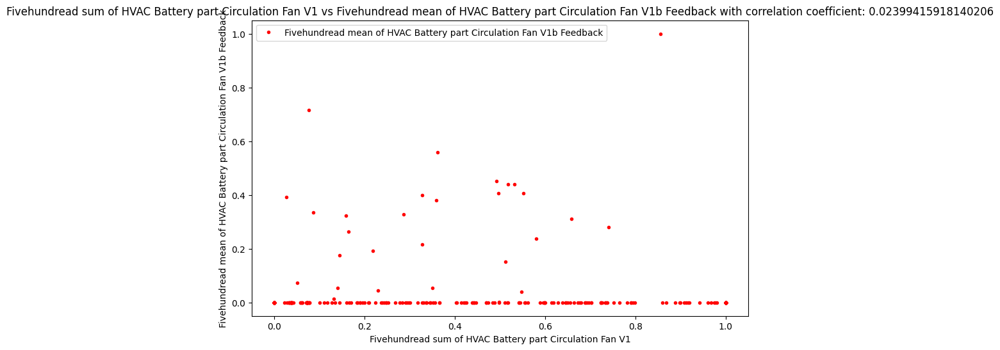

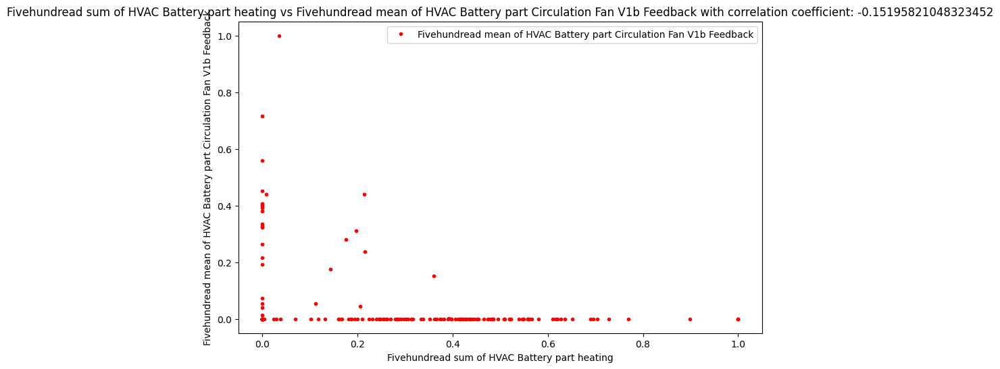

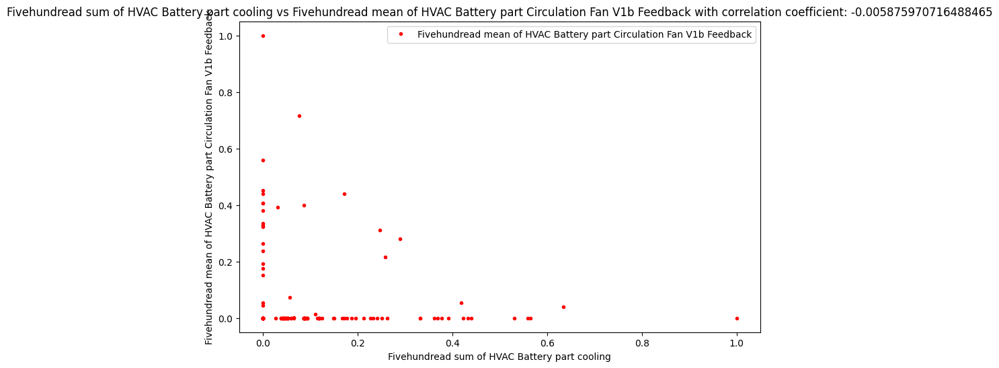

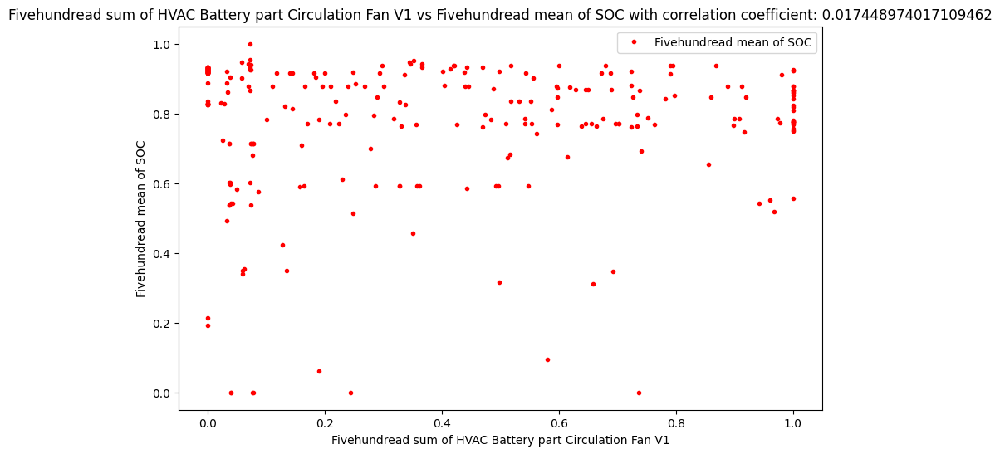

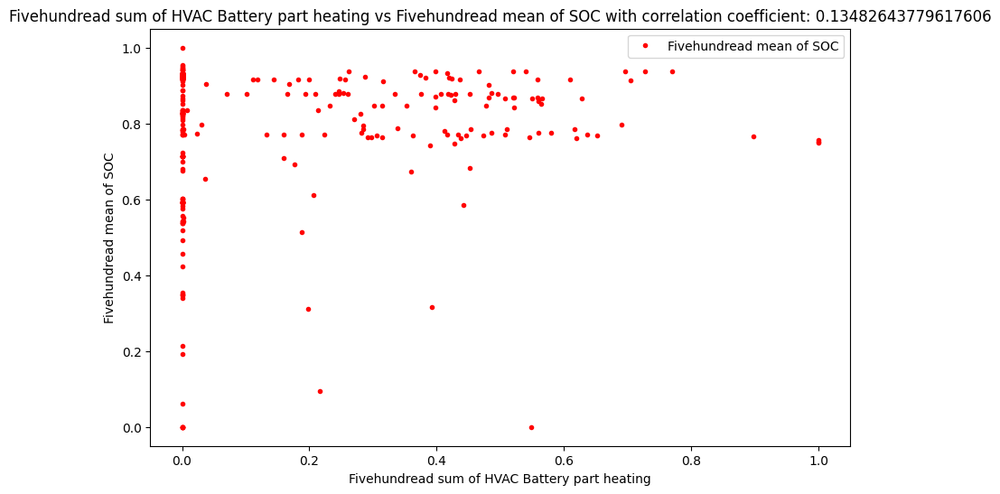

...

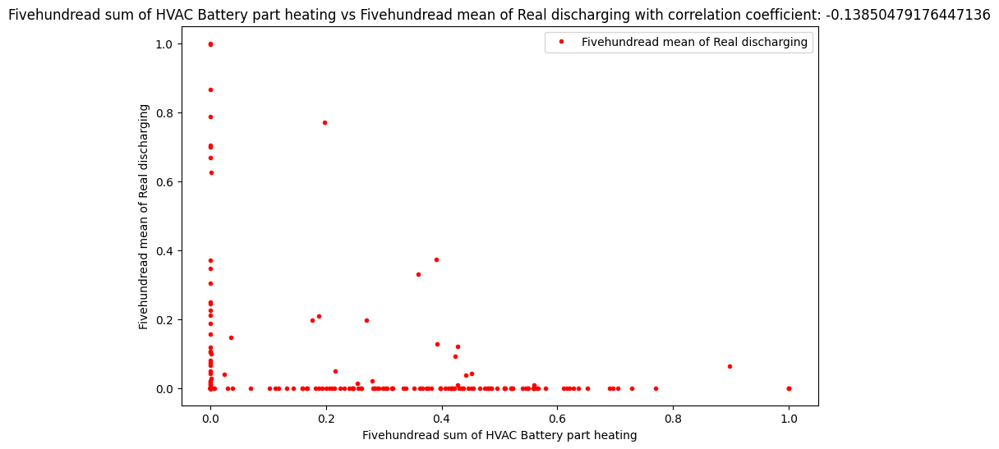

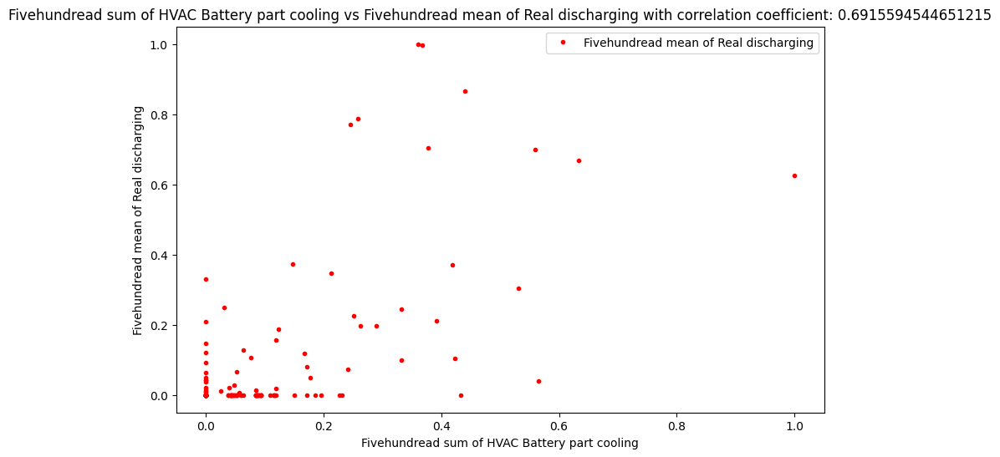

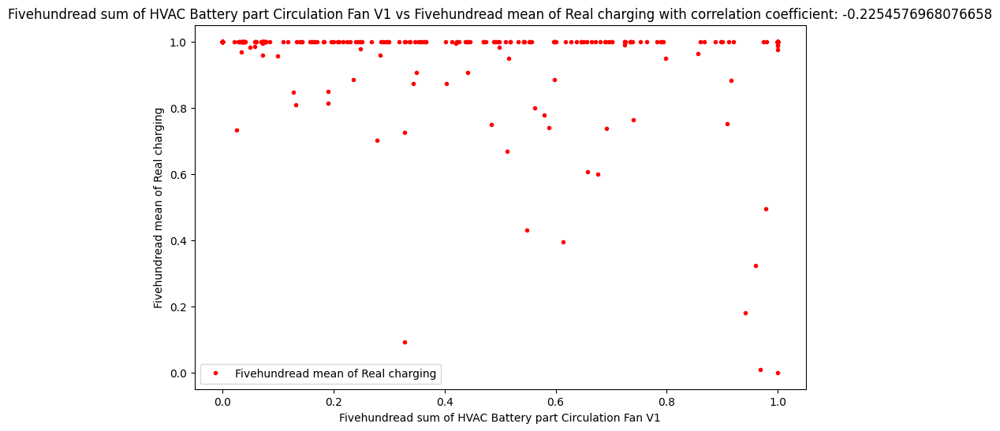

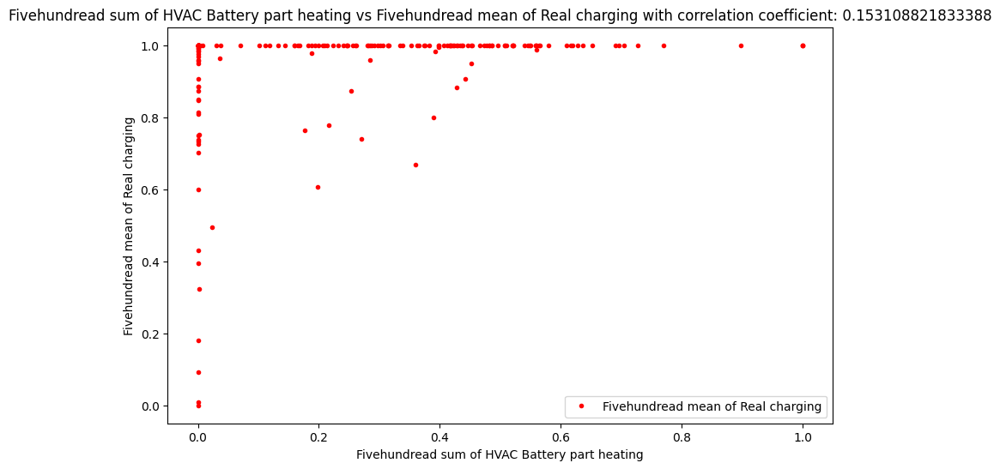

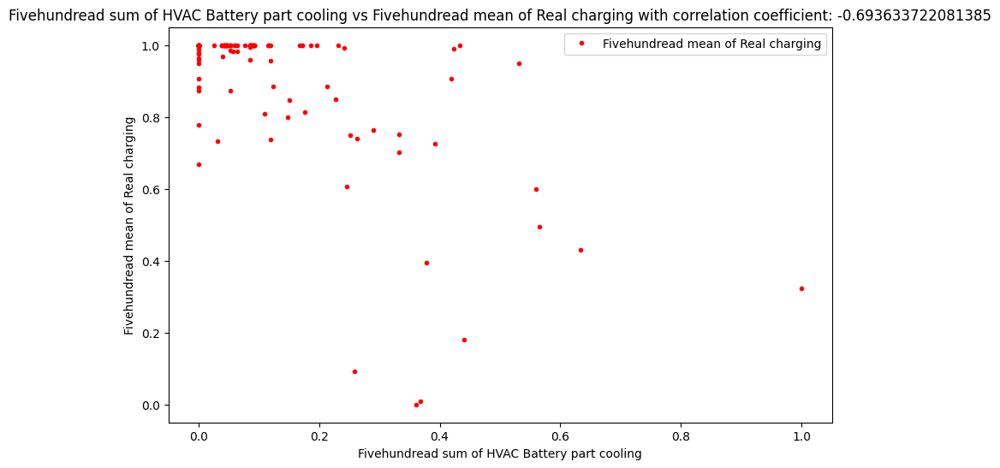

In [ ]:
data_states_fivehundread = ['Fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback', 'Fivehundread mean of SOC', 'Fivehundread mean of Avg. Cell Temperature', 'Fivehundread mean of Max. Cell Temperature', 'Fivehundread mean of Min. Cell Temperature', 'Fivehundread mean of String Power',  'Fivehundread mean of Ambient Temperature', 'Fivehundread mean of Desired dicharging','Fivehundread mean of Desired charging','Fivehundread mean of Real discharging', 'Fivehundread mean of Real charging']
binary_features_fivehundread = ['Fivehundread sum of HVAC Battery part Circulation Fan V1', 'Fivehundread sum of HVAC Battery part heating', 'Fivehundread sum of HVAC Battery part cooling']
data_states = ['Battery part Fan Vb1 Feedback', 'SOC', 'Avg. Cell Temperature', 'Max. Cell Temperature', 'Min. Cell Temperature', 'String Power',  'Ambient Temperature']
binary_features = ['HVAC Battery part Circulation Fan V1', 'HVAC Battery part heating', 'HVAC Battery part cooling']




correlated_features = []
correlated_states = []
correlation_coef_list = []

# parity plots
for state in data_states_fivehundread:
  for feature in binary_features_fivehundread:
    plt.figure(figsize=(10, 6))
    plt.plot((df_fivehundread[feature]-min(df_fivehundread[feature]))/(max(df_fivehundread[feature])-min(df_fivehundread[feature])), (df_fivehundread[state]-min(df_fivehundread[state]))/(max(df_fivehundread[state])-min(df_fivehundread[state])), '.r', label=state)

    plt.xlabel(feature)
    plt.ylabel(state)
    plt.legend()
    plt.title(feature + ' vs ' + state + ' with correlation coefficient: ' + str(np.corrcoef((df_fivehundread[state]-min(df_fivehundread[state]))/(max(df_fivehundread[state])-min(df_fivehundread[state])), (df_fivehundread[feature]-min(df_fivehundread[feature]))/(max(df_fivehundread[feature])-min(df_fivehundread[feature])))[0,1]))

    # regression
    normalised_feature = (df_fivehundread[feature]-min(df_fivehundread[feature]))/(max(df_fivehundread[feature])-min(df_fivehundread[feature]))
    normalised_state = (df_fivehundread[state]-min(df_fivehundread[state]))/(max(df_fivehundread[state])-min(df_fivehundread[state]))
    correlation_coef = np.corrcoef([normalised_feature], [normalised_state])[0,1]
    if abs(correlation_coef) > 0.5:
      correlated_features.append(feature)
      correlated_states.append(state)
      correlation_coef_list.append(str(correlation_coef))

    print(f"Correlation coefficient for {state} vs {feature} equals {correlation_coef}")



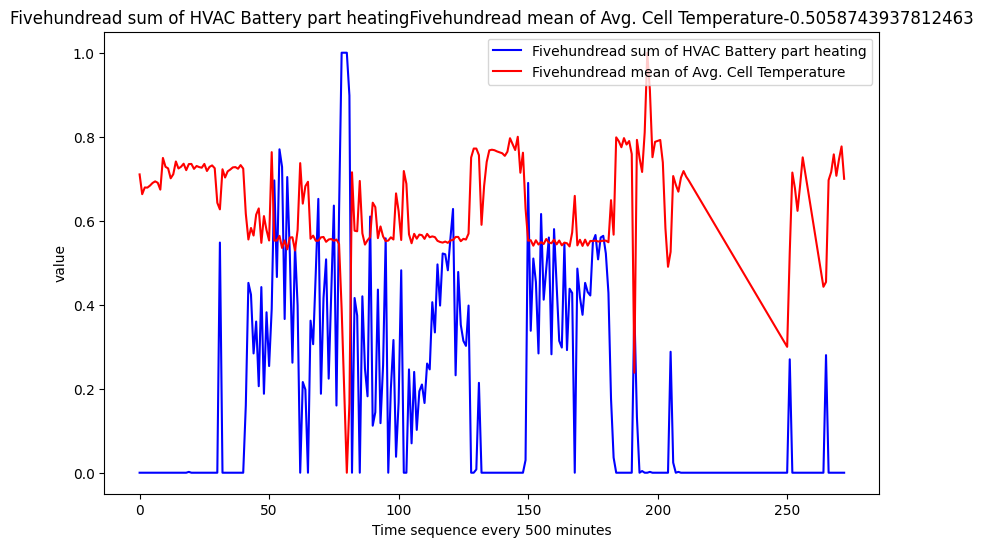

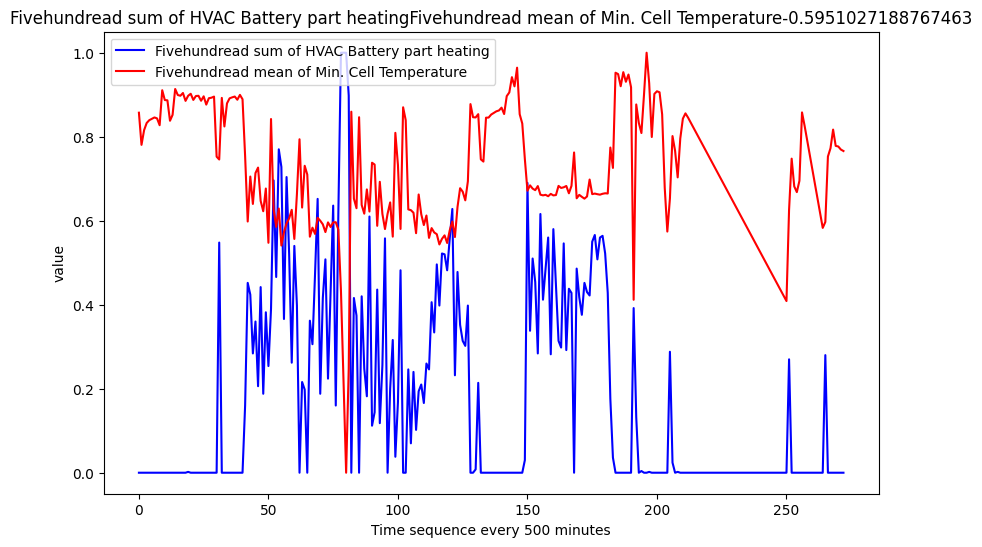

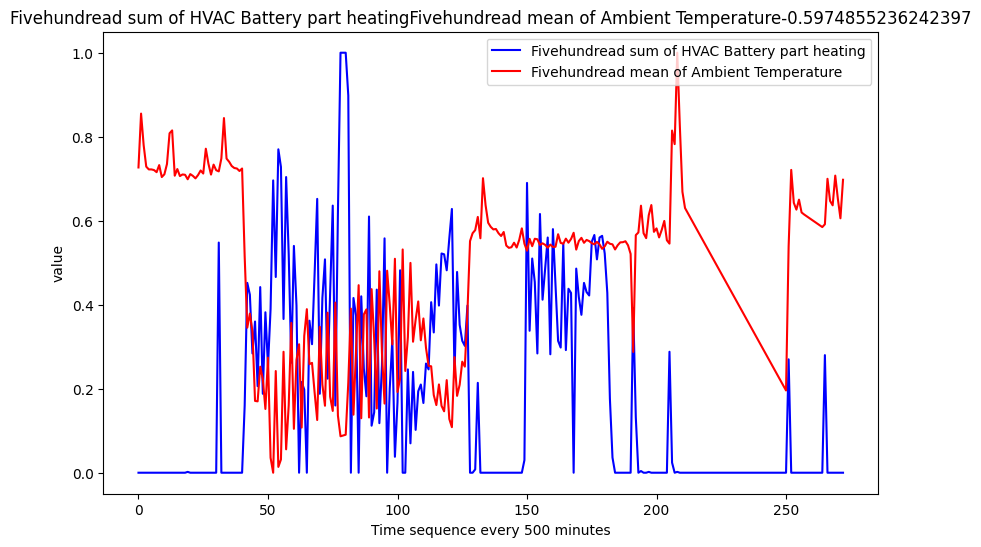

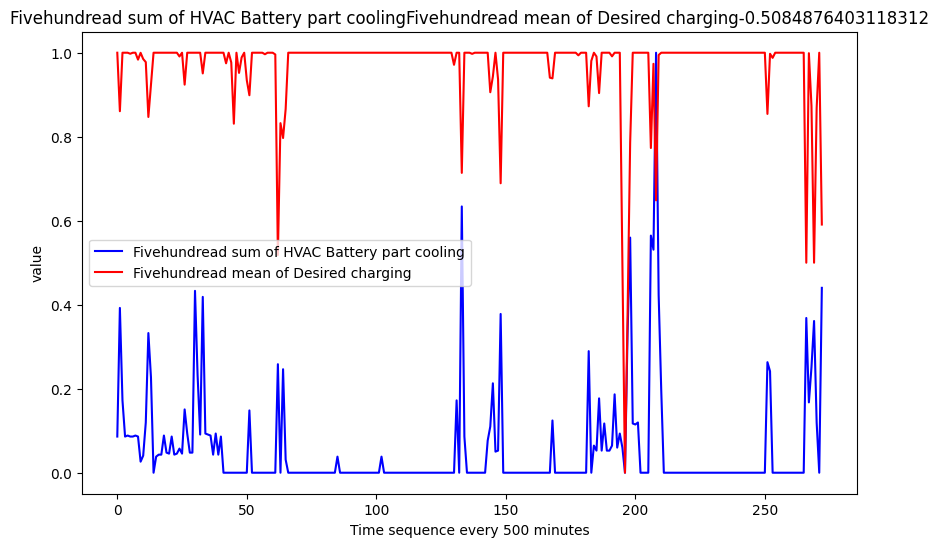

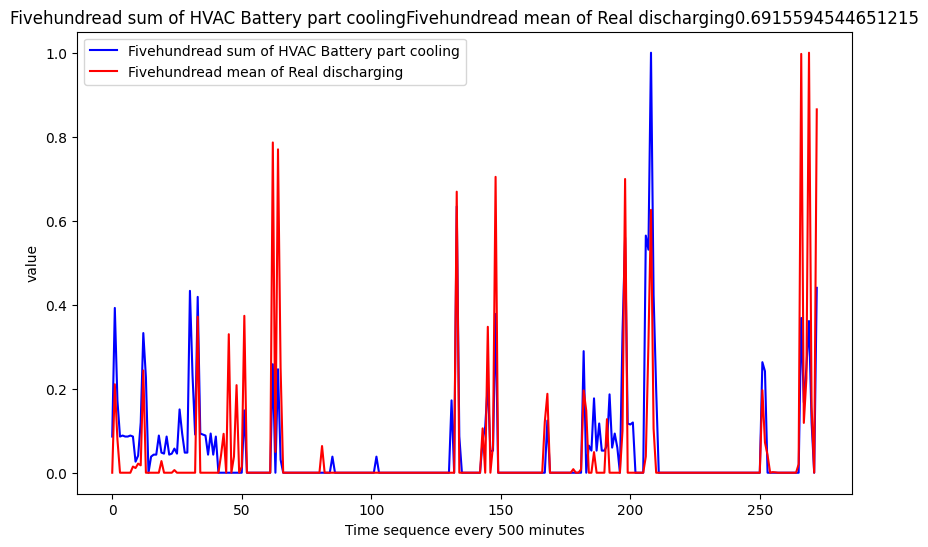

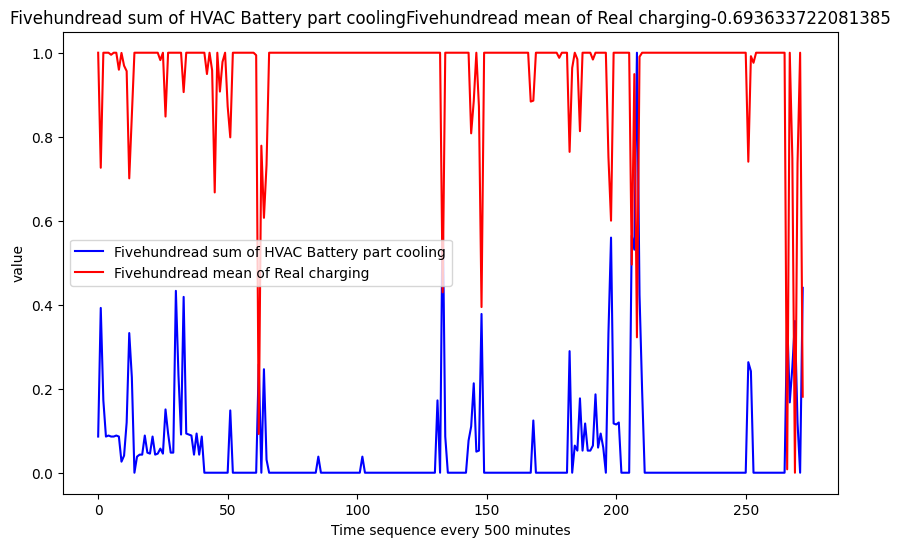

In [ ]:
# plotting normalise linecharts for state and input HVAC feature
for i in range(len(correlated_features)):
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(0,len(df_fivehundread)), (df_fivehundread[correlated_features[i]]-min(df_fivehundread[correlated_features[i]]))/(max(df_fivehundread[correlated_features[i]])-min(df_fivehundread[correlated_features[i]])), 'b', label=correlated_features[i])
  plt.plot(np.arange(0,len(df_fivehundread)), (df_fivehundread[correlated_states[i]]-min(df_fivehundread[correlated_states[i]]))/(max(df_fivehundread[correlated_states[i]])-min(df_fivehundread[correlated_states[i]])), 'r', label=correlated_states[i])
  plt.xlabel('Time sequence every 500 minutes')
  plt.ylabel('value')
  plt.legend()
  plt.title(correlated_features[i] + correlated_states[i]+correlation_coef_list[i])


HVAC error finding - for concrete pairs

In [ ]:
# similair method with highlighting points - at first we try it for df_fivehundrea with sampling period (however it is logically not that correct to find change values for aggrgated data...)
data_states_fivehundread = ['fivehundread mean of HVAC Battery part Circulation Fan V1b Feedback', 'fivehundread mean of SOC', 'fivehundread mean of Avg. Cell Temperature', 'fivehundread mean of Max. Cell Temperature', 'fivehundread mean of Min. Cell Temperature', 'fivehundread mean of String Power',  'fivehundread mean of Ambient Temperature', 'fivehundread mean of Desired dicharging','fivehundread mean of Desired charging','fivehundread mean of Real discharging', 'fivehundread mean of Real charging']
binary_features_fivehundread = ['fivehundread sum of HVAC Battery part Circulation Fan V1', 'fivehundread sum of HVAC Battery part heating', 'fivehundread sum of HVAC Battery part cooling']
data_states = ['Battery part Fan Vb1 Feedback', 'SOC', 'Avg. Cell Temperature', 'Max. Cell Temperature', 'Min. Cell Temperature', 'String Power',  'Ambient Temperature']
binary_features = ['HVAC Battery part Circulation Fan V1', 'HVAC Battery part heating', 'HVAC Battery part cooling']


In [ ]:
feature_indices_dict = {}
state_indices_dict = {}
result_dict = {}
new_vector_dict = {}

# to make a code simpler, we use dictionaries
for i in range(0,len(correlated_features)):

    feature_indices_dict[i] = np.zeros(len(df_fivehundread))
    state_indices_dict[i] = np.zeros(len(df_fivehundread))
    result_dict[i] = np.zeros(len(df_fivehundread))
    new_vector_dict[i] = np.full(len(state_indices_dict[i]), np.nan)

data_states_fivehundread = correlated_states
binary_features = correlated_features
indices_features = np.zeros(len(df_fivehundread)) #initialization - we put there whole data frame and then we remove zero values

# in the first step we find indices of those data belonging to HVAC features which are followed by different value (there comes to change)

a=0
for feature in binary_features:
  for i in range(0,len(df_fivehundread.index)-1):
    if df_fivehundread.at[df_fivehundread.index[i], feature] != df_fivehundread.at[df_fivehundread.index[i+1], feature]: #and i not in indices_features:
      #print(a)
      feature_indices_dict[a][i] = i
  a+=1


# Now we do the same for states - again, we are collecting indices of those data points which are followed by different value (not the same one)...
a=0
for state in data_states_fivehundread:
  for i in range(0,len(df_fivehundread.index)-1):
    if df_fivehundread.at[df_fivehundread.index[i], state] != df_fivehundread.at[df_fivehundread.index[i+1], state]: #and i not in indices_features:
      state_indices_dict[a][i] = i
  a+=1
for i in range(0,len(data_states_fivehundread)):
  feature_indices_dict[i] = [x for x in feature_indices_dict[i] if x != 0] #removal of zeros
  state_indices_dict[i] = [x for x in state_indices_dict[i] if x != 0]
  result_dict[i] = [x for x in feature_indices_dict[i] if x not in state_indices_dict[i]]
  change_values = result_dict[i]
  print(change_values)

[]
[]
[]
[2.0, 3.0, 6.0, 14.0, 15.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 27.0, 29.0, 30.0, 31.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 84.0, 85.0, 101.0, 102.0, 131.0, 134.0, 142.0, 187.0, 188.0, 192.0, 193.0, 199.0, 200.0, 201.0, 210.0]
[3.0, 4.0, 6.0, 13.0, 14.0, 15.0, 17.0, 20.0, 21.0, 22.0, 25.0, 26.0, 27.0, 29.0, 30.0, 31.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 84.0, 85.0, 101.0, 102.0, 130.0, 131.0, 134.0, 184.0, 187.0, 188.0, 192.0, 193.0, 194.0, 195.0, 199.0, 200.0, 201.0, 210.0]
[2.0, 3.0, 6.0, 14.0, 15.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 27.0, 29.0, 30.0, 31.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 84.0, 85.0, 101.0, 102.0, 130.0, 131.0, 134.0, 142.0, 187.0, 188.0, 192.0, 193.0, 194.0, 195.0, 199.0, 200.0, 201.0, 210.0]


In [ ]:
correlated_states

['Fivehundread mean of Avg. Cell Temperature',
 'Fivehundread mean of Min. Cell Temperature',
 'Fivehundread mean of Ambient Temperature',
 'Fivehundread mean of Desired charging',
 'Fivehundread mean of Real discharging',
 'Fivehundread mean of Real charging']

we can see that some values are [] some are not empty

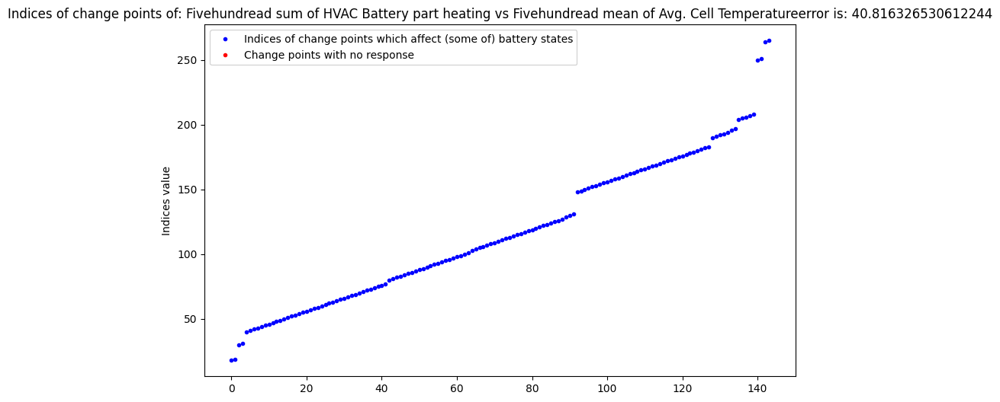

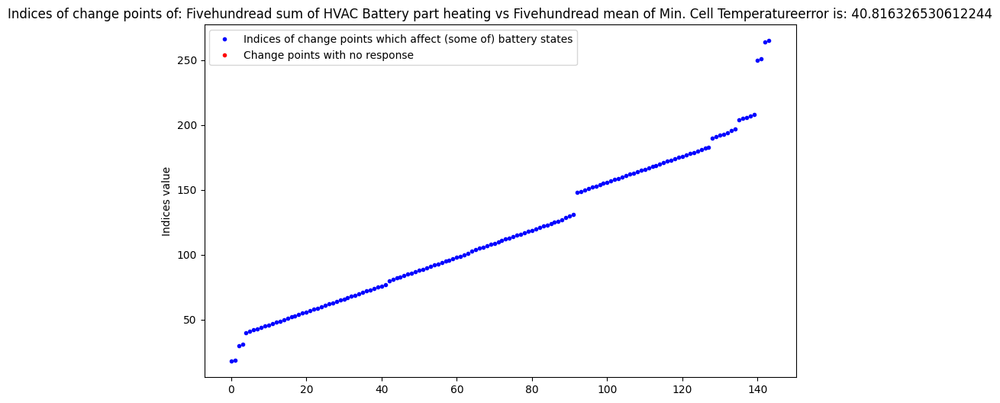

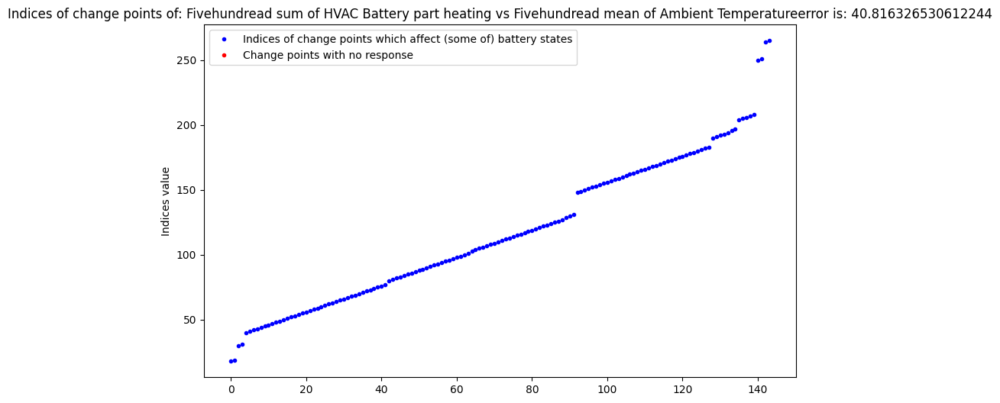

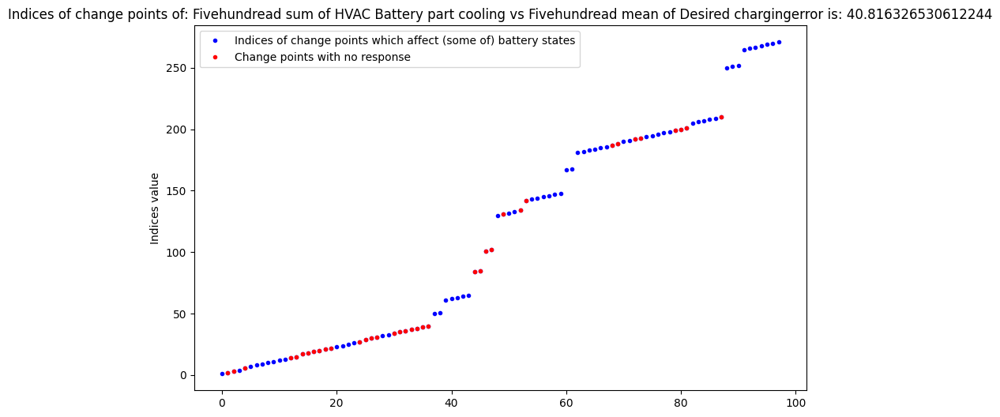

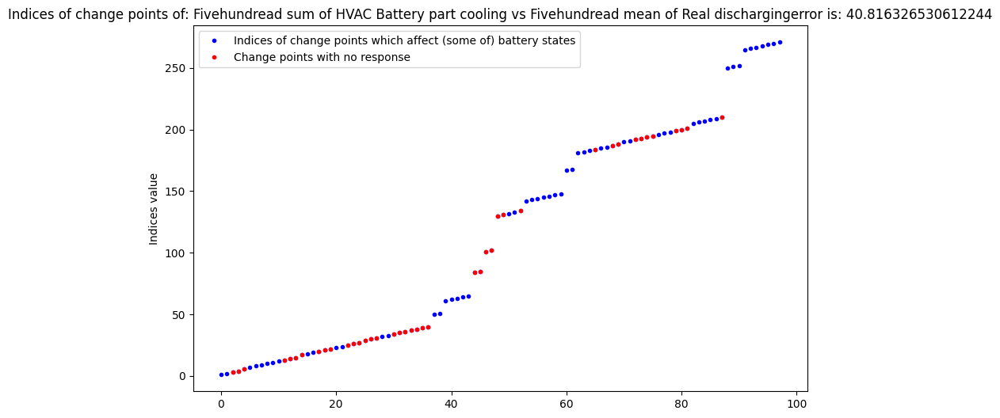

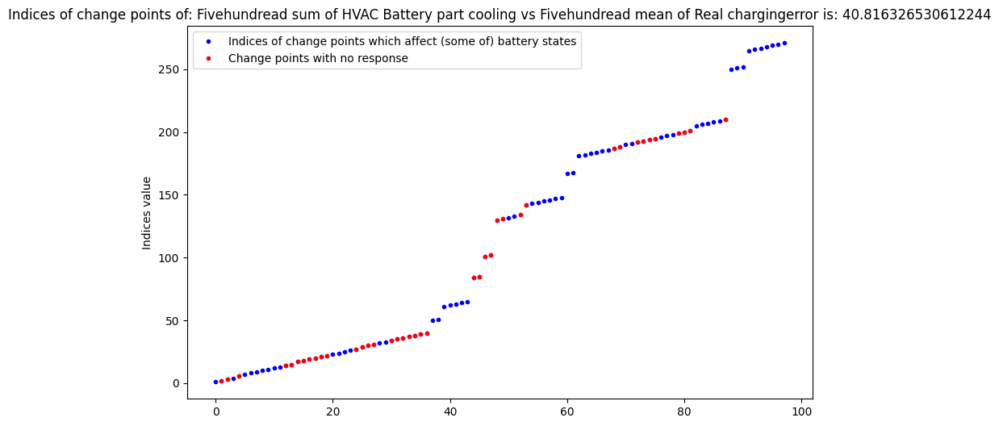

In [ ]:
# new_vectors_dict = {}

# for i in range(0,len(correlated_features)):

#     new_vectors_dict[f'indices_{i}'] = np.zeros(len(df_fivehundread))
#     state_indices_dict[f'indices_{i}'] = np.zeros(len(df_fivehundread))
#     result_dict[f'result_{i}'] = np.zeros(len(df_fivehundread))
#     new_vectors_dict[i] = np.zeros(len(df_fivehundread))
#     state_indices_dict[i] = np.zeros(len(df_fivehundread))


#new_vector = np.full(len(feature_indices_dict[), np.nan)
for k in range(0,len(correlated_features)):
  for i in range(len(feature_indices_dict[k])):
    if feature_indices_dict[k][i] in result_dict[k] :
      new_vector_dict[k][i] = feature_indices_dict[k][i]

# highlighting change point indices
for i in range(len(correlated_features)):
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(0,len(feature_indices_dict[i])), feature_indices_dict[i], '.b', label='Indices of change points which affect (some of) battery states')
  plt.plot(np.arange(0,len(new_vector_dict[i])), new_vector_dict[i], 'r.', label='Change points with no response')
  #plt.xlabel('Week day')
  plt.ylabel('Indices value')
  plt.legend()
  plt.title('Indices of change points of: ' + correlated_features[i] + ' vs ' + correlated_states[i] + 'error is: ' + str(len(result_dict[k])/len(feature_indices_dict[k])*100))


Same for df_resampled... HVAC errors will be more accurate, but on the other hand, correlation finding for binary variables will not be really correct

In [ ]:
# we have manually copied same features but excluded the 'fivehundread' so it will be same as column names for df_resampled
data_states = ['SOC',
 'SOC',
 'Avg. Cell Temperature',
 'Max. Cell Temperatue',
 'Min. Cell Temperature',
 'Ambient Temperature',
 'Desired discharging', 'Desired charging', 'Real discharging', 'Real charging']

binary_features = ['HVAC Battery part Circulation Fan V1',
 'HVAC Battery part heating',
 'HVAC Battery part Circulation Fan V1',
 'HVAC Battery part Circulation Fan V1',
 'HVAC Battery part Circulation Fan V1',
 'HVAC Battery part cooling',
 'HVAC Battery part cooling',
 'HVAC Battery part cooling',
 'HVAC Battery part cooling',
 'HVAC Battery part cooling']

feature_indices_dict = {}
state_indices_dict = {}
result_dict = {}
new_vector_dict = {}


for i in range(0,len(binary_features)):

    feature_indices_dict[i] = np.zeros(len(df_resampled))
    state_indices_dict[i] = np.zeros(len(df_resampled))
    result_dict[i] = np.zeros(len(df_resampled))
    new_vector_dict[i] = np.full(len(state_indices_dict[i]), np.nan)



indices_features = np.zeros(len(df_resampled))

a=0
for feature in binary_features:
  for i in range(0,len(df_resampled.index)-1):
    if df_resampled.at[df_resampled.index[i], feature] != df_resampled.at[df_resampled.index[i+1], feature]:
      #print(a)
      feature_indices_dict[a][i] = i
  a+=1

a=0
for state in data_states:
  for i in range(0,len(df_resampled.index)-1):
    if df_resampled.at[df_resampled.index[i], state] != df_resampled.at[df_resampled.index[i+1], state]:
      state_indices_dict[a][i] = i
  a+=1
for i in range(0,len(data_states)):
  feature_indices_dict[i] = [x for x in feature_indices_dict[i] if x != 0] #removal of zeros
  state_indices_dict[i] = [x for x in state_indices_dict[i] if x != 0]
  result_dict[i] = [x for x in feature_indices_dict[i] if x not in state_indices_dict[i]]
  change_values = result_dict[i]
  print(change_values)

[427.0, 463.0, 954.0, 1157.0, 1193.0, 1391.0, 1427.0, 1805.0, 1841.0, 2364.0, 2401.0, 2859.0, 2895.0, 3377.0, 3413.0, 3873.0, 3910.0, 4236.0, 4272.0, 4845.0, 4856.0, 5045.0, 5062.0, 5552.0, 5570.0, 5688.0, 5707.0, 5986.0, 6005.0, 6595.0, 6734.0, 6754.0, 7951.0, 7967.0, 8328.0, 8346.0, 8687.0, 8705.0, 9024.0, 9043.0, 9397.0, 9415.0, 9929.0, 10170.0, 10189.0, 10551.0, 10569.0, 10924.0, 10942.0, 11382.0, 11400.0, 11749.0, 11768.0, 12199.0, 12203.0, 12265.0, 12286.0, 12877.0, 12897.0, 13185.0, 13204.0, 13441.0, 13569.0, 13589.0, 13945.0, 13964.0, 14466.0, 14486.0, 14758.0, 14778.0, 15063.0, 15082.0, 15347.0, 15450.0, 15617.0, 15935.0, 15936.0, 15986.0, 16079.0, 16097.0, 16301.0, 16321.0, 16644.0, 16661.0, 16860.0, 16974.0, 16996.0, 17179.0, 17199.0, 17424.0, 17443.0, 17664.0, 17683.0, 17904.0, 17923.0, 18159.0, 18178.0, 18452.0, 18470.0, 18750.0, 18768.0, 19070.0, 19089.0, 19396.0, 19416.0, 19744.0, 19762.0, 20082.0, 20101.0, 20400.0, 20418.0, 20991.0, 21034.0, 21035.0, 21041.0, 21042.0, 2

Plotting

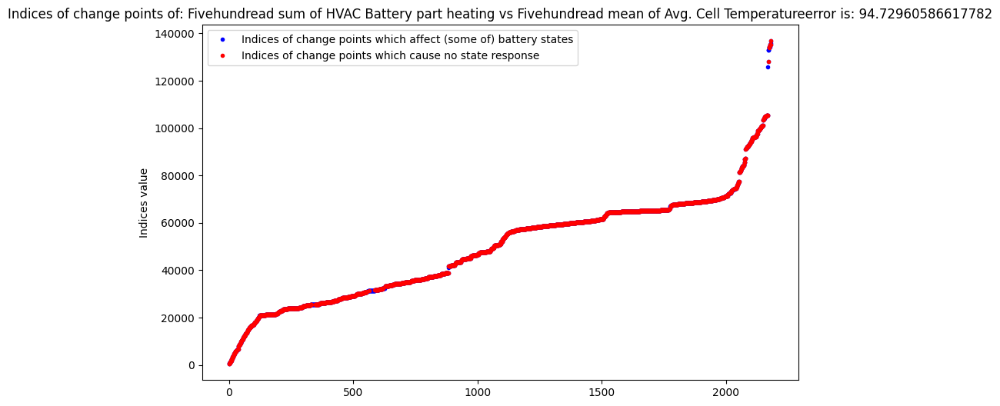

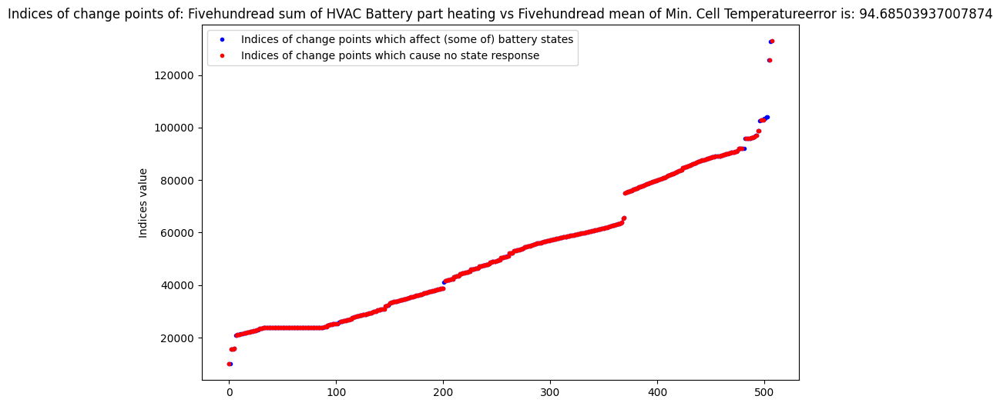

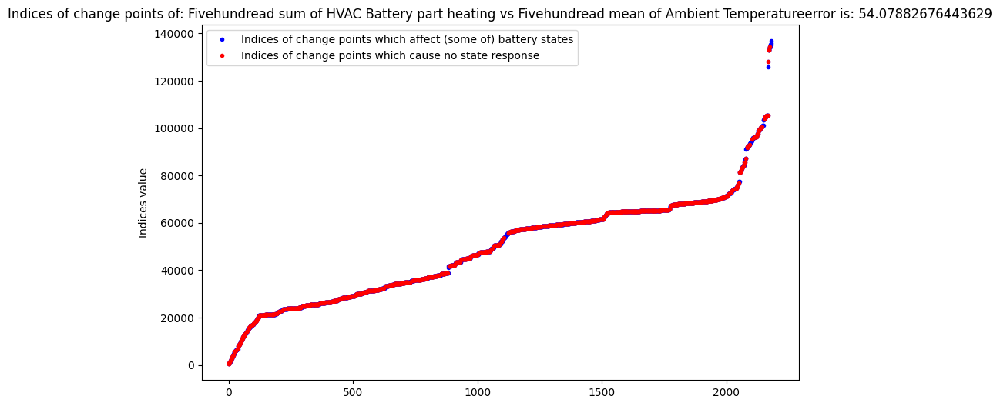

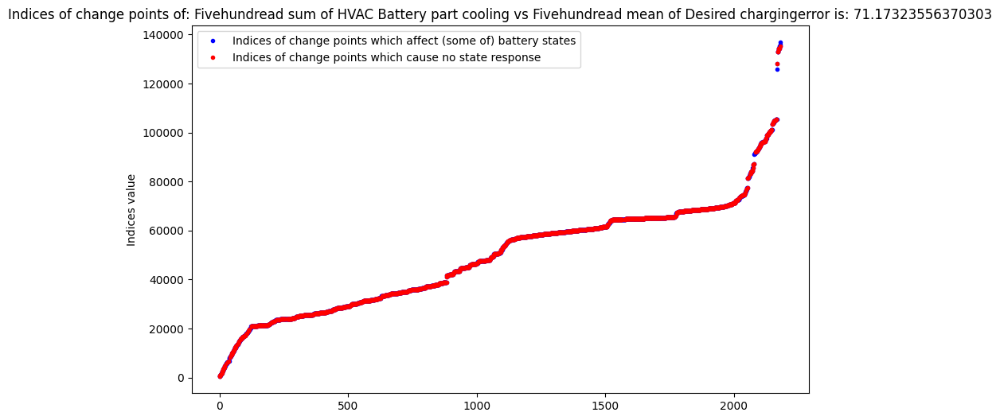

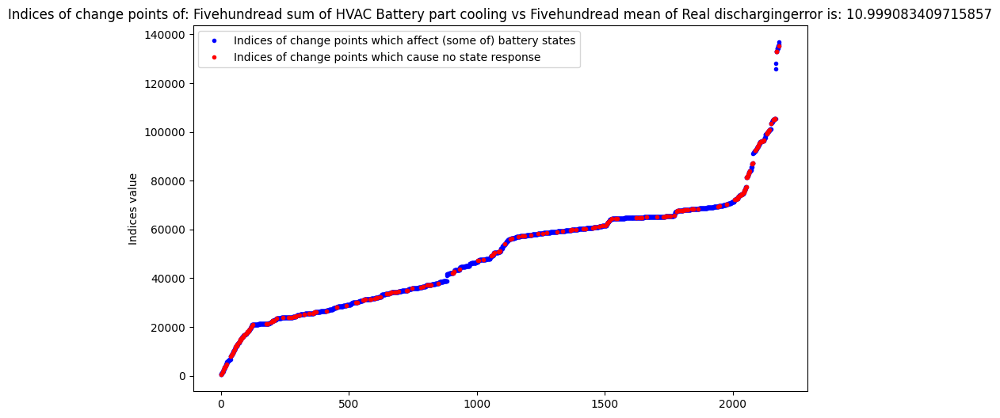

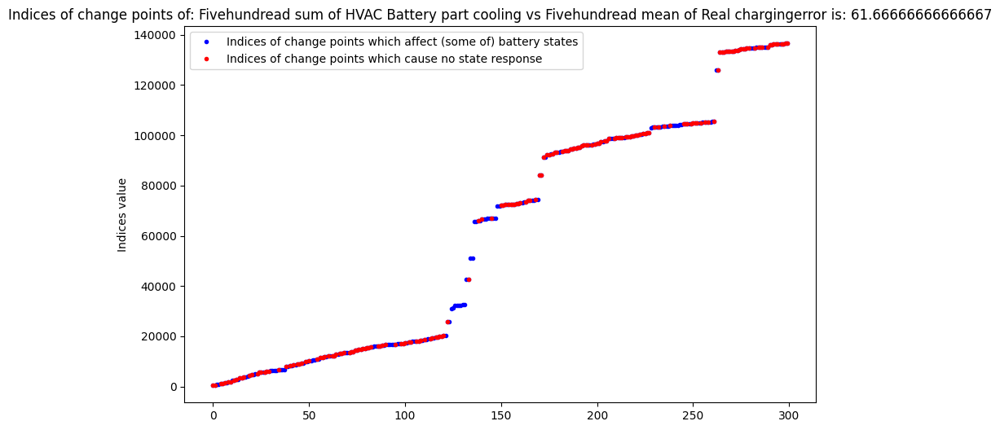

In [ ]:
for k in range(0,len(correlated_features)):
  for i in range(len(feature_indices_dict[k])):
    if feature_indices_dict[k][i] in result_dict[k] :
      new_vector_dict[k][i] = feature_indices_dict[k][i]

# highlighting change point indices
for i in range(len(correlated_features)):
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(0,len(feature_indices_dict[i])), feature_indices_dict[i], '.b', label='Indices of change points which affect (some of) battery states')
  plt.plot(np.arange(0,len(new_vector_dict[i])), new_vector_dict[i], 'r.', label='Indices of change points which cause no state response')

  plt.ylabel('Indices value')
  plt.legend()
  plt.title('Indices of change points of: ' + correlated_features[i] + ' vs ' + correlated_states[i] + 'error is: ' + str(len(result_dict[i])/len(feature_indices_dict[i])*100))

12.A and B

In this task we are going to look on Comparison of Real and Setpoint value of charging - discharging. We'll try to explain the reason why in some cases real values deviate from setpoint ones

In [ ]:
df_resampled['Deviation Reason'] = ''
threshold = 0.5  # We chose this value based on the maximal one (see the cell below) and average one


deviation_mask = (df_resampled['String Power'] - df_resampled['Active Power Setpoint']).abs() > threshold
df_resampled.loc[deviation_mask, 'Deviation Reason'] = 'Significant deviation'
df_resampled.loc[~deviation_mask, 'Deviation Reason'] = 'Acceptable deviation' #what happens if the condition is not fullfilled

# B. Identify power limitations - by that is meant when the difference is too big
df_resampled['Power Limitation'] = deviation_mask
df_resampled['Deviation Value'] = (df_resampled['String Power'] - df_resampled['Active Power Setpoint']).abs()

#check if significant deviations exist and when
i=0
indices = []
for value in df_resampled['Deviation Reason']:
  if value == 'Significant deviation': #all of the significant deviations have the deviation value highe than treshold value
    indices.append(i)
  i+=1
print(len(indices))



# Display or save the updated DataFrame
# print(df_resampled.head(4000))

1173


In [ ]:
# how to choose a threshold
np.max(df_resampled['Deviation Value'])
df_resampled['Deviation Value'][df_resampled['Deviation Value'] != 0]

time
2022-02-21 12:57:00+00:00    0.950000
2022-02-21 12:58:00+00:00    0.054082
2022-02-21 12:59:00+00:00    0.055964
2022-02-21 13:00:00+00:00    0.057473
2022-02-21 13:01:00+00:00    0.059918
2022-02-21 13:02:00+00:00    0.062127
2022-02-21 13:03:00+00:00    0.065173
2022-02-21 13:04:00+00:00    0.058191
2022-02-21 13:05:00+00:00    0.058673
2022-02-21 13:06:00+00:00    0.065155
2022-02-21 13:07:00+00:00    0.068582
2022-02-21 13:08:00+00:00    0.063600
2022-02-21 13:09:00+00:00    0.051936
2022-02-21 13:10:00+00:00    0.060282
2022-02-21 13:11:00+00:00    0.060845
2022-02-21 13:12:00+00:00    0.047027
2022-02-21 13:13:00+00:00    0.050573
2022-02-21 13:14:00+00:00    0.048282
2022-02-21 13:15:00+00:00    0.053000
2022-02-21 13:16:00+00:00    0.044227
2022-02-21 13:17:00+00:00    0.049382
2022-02-21 13:18:00+00:00    0.037327
2022-02-21 13:19:00+00:00    0.040518
2022-02-21 13:20:00+00:00    0.043118
2022-02-21 13:21:00+00:00    0.053300
2022-02-21 13:22:00+00:00    0.051718
2022-02

Text(0, 0.5, 'Active power setpoint')

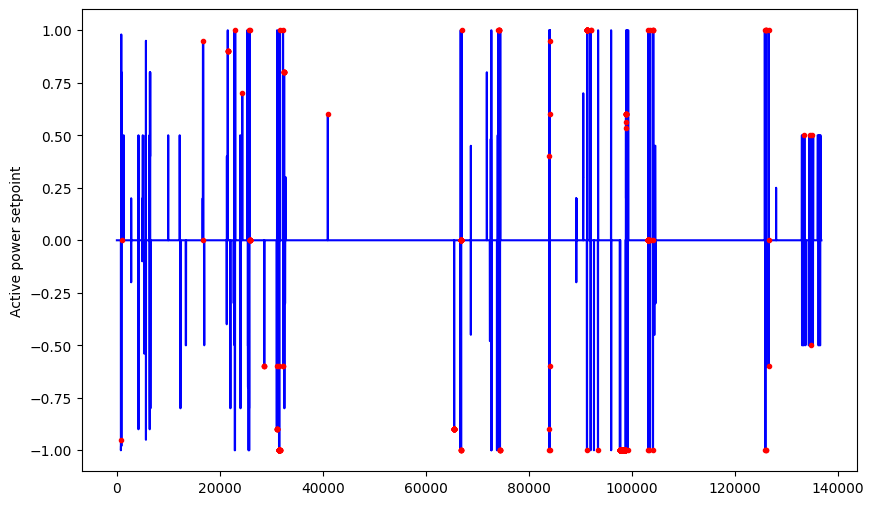

In [ ]:
#plotting of these values
deviation_vector_setpoint = np.full(len(df_resampled), np.nan)
for indice in indices:
  deviation_vector_setpoint[indice] = df_resampled.at[df_resampled.index[indice], 'Active Power Setpoint']

plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(df_resampled)), df_resampled['Active Power Setpoint'], 'b', label='Active Power Setpoint')
plt.plot(np.arange(len(df_resampled)), deviation_vector_setpoint, 'r.', label='Meaningful points - deviations')
#plt.xlabel('Week')
plt.ylabel('Active power setpoint')
#plt.title()

Based on the chart we can see that these values occur there where there comes to change of the setpoint - something like transport delay occurs

XIII. Discuss rare high SOC - in this task we will very similarly look at SOC parameter. At first we plot the dependency, then we select treshhold which SOC should not exceed. And lastly we plot these above treshold values.

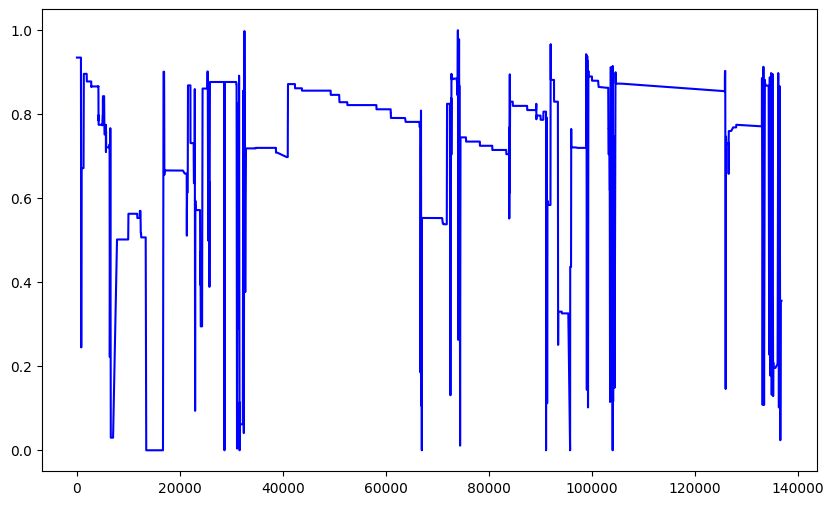

In [ ]:
# df_resampled dataset
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(df_resampled)), df_resampled['SOC'], 'b', label='SOC every minute')

In [ ]:
# Similarly as with String power, threshold is set to mark data that exceeds it - rare high values. To get the data which exceed it we use following code:
threshold = 0.95


deviation_mask_SOC = df_resampled['SOC']  > threshold
df_resampled.loc[deviation_mask_SOC, 'SOC information'] = 'SOC exceeded'
df_resampled.loc[~deviation_mask_SOC, 'SOC information'] = 'SOC bellow threshold'


i=0
indices = []
for value in df_resampled['SOC information']:
  if value == 'SOC exceeded':
    #print('No')
    indices.append(i)
  i+=1
print(len(indices))


86


Text(0, 0.5, 'SOC value')

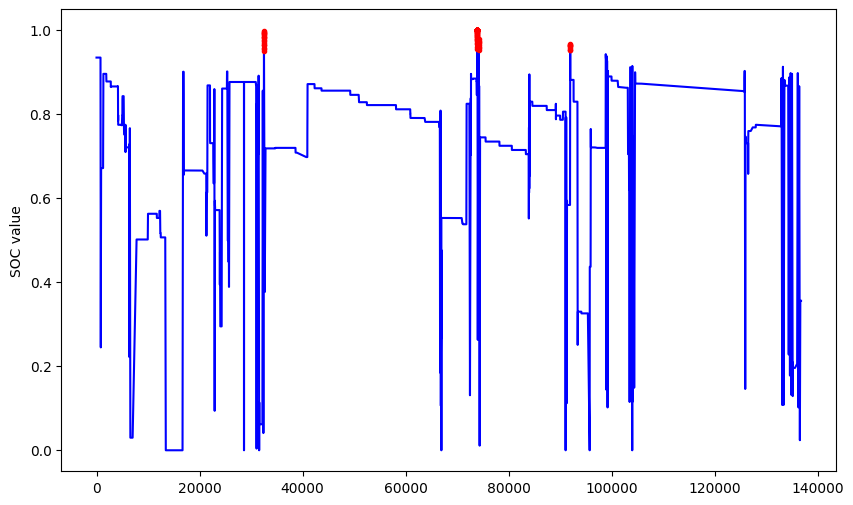

In [ ]:
# plotting
deviation_vector_setpoint = np.full(len(df_resampled), np.nan)
for indice in indices:
  deviation_vector_setpoint[indice] = df_resampled.at[df_resampled.index[indice], 'SOC']

plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(df_resampled)), df_resampled['SOC'], 'b', label='SOC values')
plt.plot(np.arange(len(df_resampled)), deviation_vector_setpoint, 'r.', label='Exceeded SOC values')
plt.ylabel('SOC value')

In [ ]:
df_resampled[32450:32600]
#indices
# here we took a look at other features indexes of which were same as the ones for which we got 'red valued' - above the threshold. They had one similair thing. Active power setpoint was positive and high for quite a long time contineously before this time - that caused that the SOC was too high

,Active Power Setpoint,SOC,HVAC Battery part Circulation Fan V1,HVAC Battery part heating,HVAC Battery part cooling,Battery part Fan Vb1 Feedback,Avg. Cell Temperature,Max. Cell Temperatue,Min. Cell Temperature,String Power,Outside Temperature,Ambient Temperature,data_source,Desired discharging,Desired charging,Real discharging,Real charging,Deviation Reason,Power Limitation,Deviation Value,SOC information
time,,,,,,,,,,,,,,,,,,,,,
2022-03-15 12:51:00+00:00,0.8,0.449062,0.0,0.0,0.0,0.899634,0.672356,0.698558,0.643029,0.701855,0.411538,0.440024,original,0.8,NaN,0.701855,NaN,Acceptable deviation,False,0.098145,SOC bellow threshold
2022-03-15 12:52:00+00:00,0.8,0.456875,0.0,0.0,0.0,0.944322,0.673798,0.701442,0.639904,0.705418,0.411795,0.440024,original,0.8,NaN,0.705418,NaN,Acceptable deviation,False,0.094582,SOC bellow threshold
2022-03-15 12:53:00+00:00,0.8,0.461406,0.0,0.0,0.0,0.956288,0.674639,0.702284,0.639183,0.706764,0.412051,0.440024,inferred,0.8,NaN,0.706764,NaN,Acceptable deviation,False,0.093236,SOC bellow threshold
2022-03-15 12:54:00+00:00,0.8,0.465938,0.0,0.0,0.0,0.968254,0.675481,0.703125,0.638462,0.708109,0.412308,0.440024,original,0.8,NaN,0.708109,NaN,Acceptable deviation,False,0.091891,SOC bellow threshold
2022-03-15 12:55:00+00:00,0.8,0.475000,0.0,0.0,0.0,1.000000,0.678365,0.706250,0.637019,0.700627,0.412564,0.441587,original,0.8,NaN,0.700627,NaN,Acceptable deviation,False,0.099373,SOC bellow threshold
2022-03-15 12:56:00+00:00,0.8,0.485000,0.0,0.0,0.0,1.000000,0.680048,0.709135,0.635337,0.704291,0.412821,0.435337,original,0.8,NaN,0.704291,NaN,Acceptable deviation,False,0.095709,SOC bellow threshold
2022-03-15 12:57:00+00:00,0.8,0.493125,0.0,0.0,0.0,1.000000,0.681490,0.710817,0.633894,0.697464,0.413077,0.435337,original,0.8,NaN,0.697464,NaN,Acceptable deviation,False,0.102536,SOC bellow threshold
2022-03-15 12:58:00+00:00,0.8,0.501875,0.0,0.0,0.0,1.000000,0.684615,0.713942,0.633894,0.702482,0.413333,0.438462,original,0.8,NaN,0.702482,NaN,Acceptable deviation,False,0.097518,SOC bellow threshold
2022-03-15 12:59:00+00:00,0.8,0.510938,0.0,0.0,0.0,1.000000,0.686058,0.715385,0.633894,0.703045,0.413590,0.450721,original,0.8,NaN,0.703045,NaN,Acceptable deviation,False,0.096955,SOC bellow threshold


# Saving data to csv

In [ ]:
# all data_frames... we need to save them separately
df.to_csv('df.csv', index=True)
df_resampled.to_csv('df_resampled.csv', index=True)
weather_df.to_csv('weather_df.csv', index=True)
df_daily.to_csv('df_daily.csv', index=True)
df_weeky.to_csv('df_weeky.csv', index=True)
df_daily_names.to_csv('df_daily_names.csv', index=True)
df_fivehundread.to_csv('df_fivehundread.csv', index=True)